# Analyze ParaRel causal tracing results (top10)

In [1]:
import json
import pandas as pd
import numpy as np
from matplotlib import pyplot as plt
import seaborn as sns
import os
import math
import scipy
import random

from experiments.causal_trace import plot_trace_heatmap, plot_trace_heatmap_from_values, plot_normalized_trace_heatmap_from_values

In [2]:
query_file = "/cephyr/users/lovhag/Alvis/projects/rome/data/P19_gpt2_xl_preds.jsonl"

## Load the queries

In [3]:
queries = pd.DataFrame()
with open(query_file) as f:
    for line in f:
        queries = queries.append(json.loads(line), ignore_index=True)
        
queries.head()

,attribute,candidate_p,candidate_prediction,candidate_rank,gold_p,gold_rank,known_id,prediction,prediction_p,prompt,relation_id,subject,template,top10_tokens,top10_tokens_probs
0,Alexandra,0.024580,London,2.0,0.000011,3197.0,0.0,New,0.038592,Allan Peiper was born in,P19,Allan Peiper,{} was born in,"[ New, the, London, 18, Toronto, Montreal...","[0.03859247639775276, 0.03803418204188347, 0.0..."
1,Alexandra,0.029013,Canada,2.0,0.000011,3354.0,1.0,the,0.077758,Allan Peiper is originally from,P19,Allan Peiper,{} is originally from,"[ New, the, London, 18, Toronto, Montreal...","[0.04142675921320915, 0.07775774598121643, 0.0..."
2,Alexandra,0.023173,Canada,2.0,0.000013,3389.0,2.0,the,0.079163,Allan Peiper was originally from,P19,Allan Peiper,{} was originally from,"[ New, the, London, 18, Toronto, Montreal...","[0.03634488210082054, 0.07916285842657089, 0.0..."
3,Alexandra,0.035623,Canada,2.0,0.000005,4780.0,3.0,the,0.154659,Allan Peiper is native to,P19,Allan Peiper,{} is native to,"[ New, the, London, 18, Toronto, Montreal...","[0.03823259472846985, 0.15465885400772095, 0.0..."
4,Alexandra,0.032304,Canada,1.0,0.000007,4640.0,4.0,the,0.132673,Allan Peiper was native to,P19,Allan Peiper,{} was native to,"[ New, the, London, 18, Toronto, Montreal...","[0.029023099690675735, 0.13267268240451813, 0...."


## Analyze the causal tracing results

- Do we observe the same patterns for impactful MLP states to restore for the same output token across paraphrases (even though this token might not be the top prediction)?
- Analyze the patterns across the top 10 tokens from when using the original LAMA prompts.

In [4]:
results_folder = "/cephyr/users/lovhag/Alvis/projects/rome/data/results/gpt2-xl/P19/causal_trace_pararel_1711765"

### Plot impact patterns for the same output tokens across paraphrases

Plotting results for subject Allan Peiper...


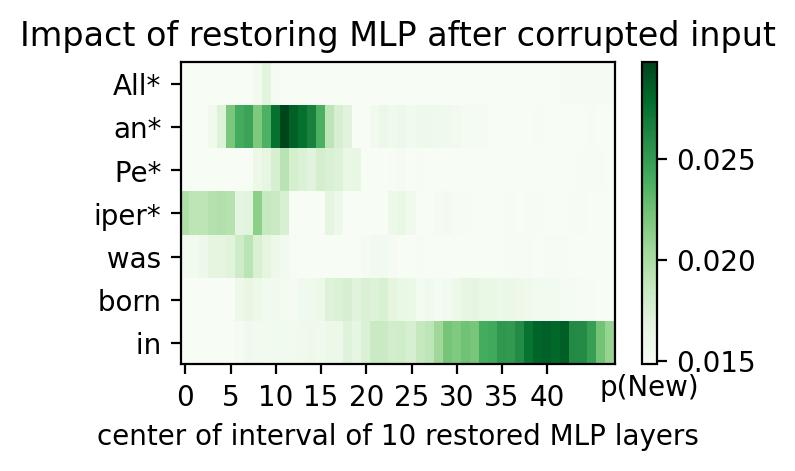

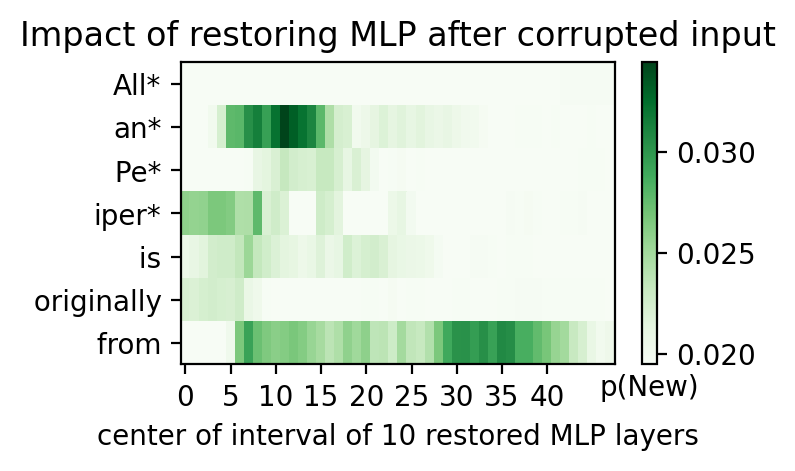

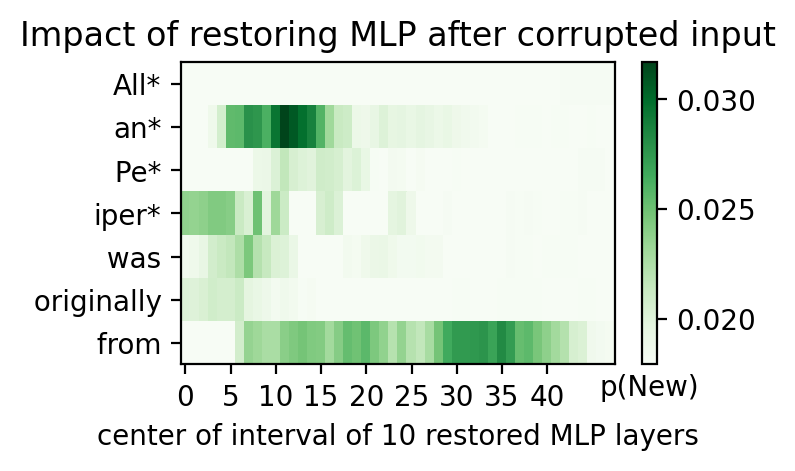

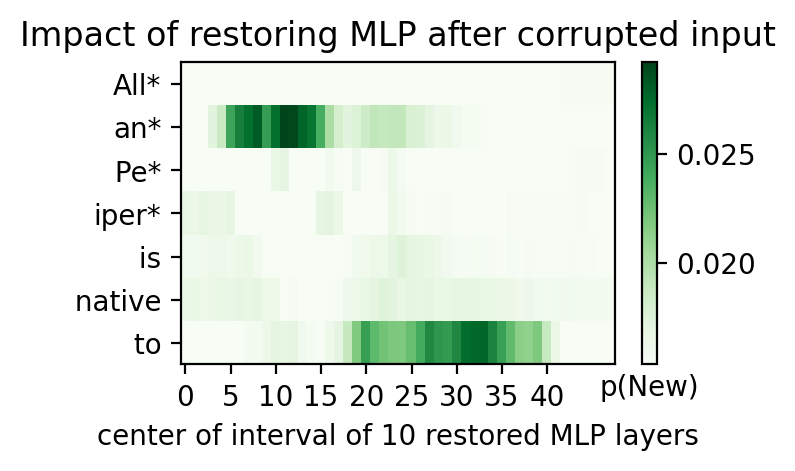

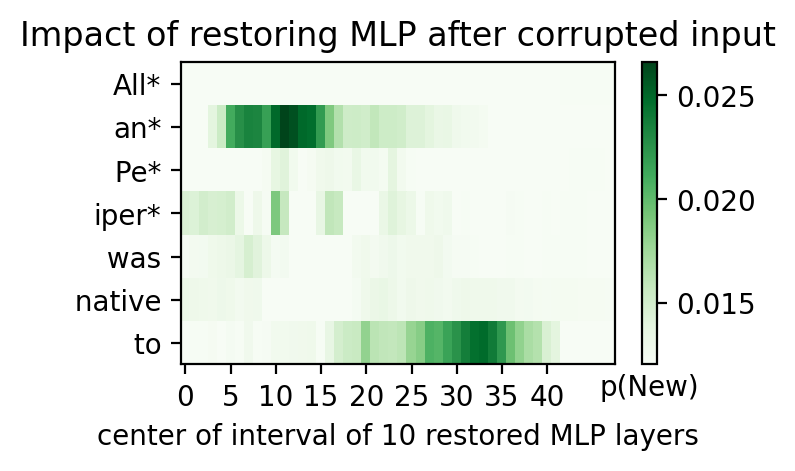

...

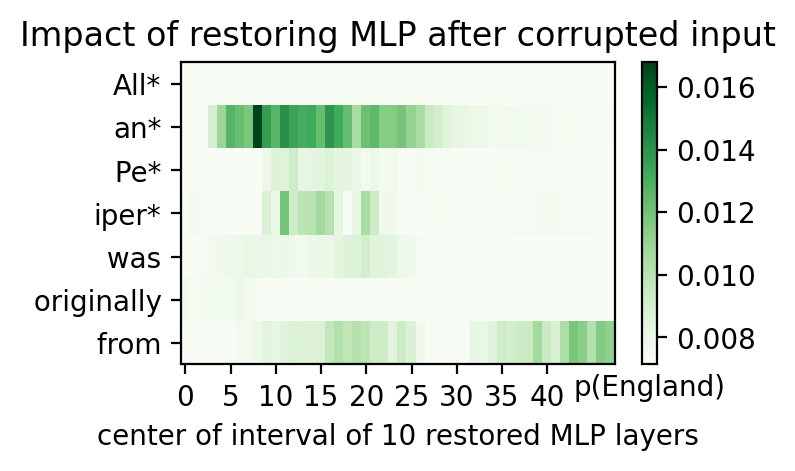

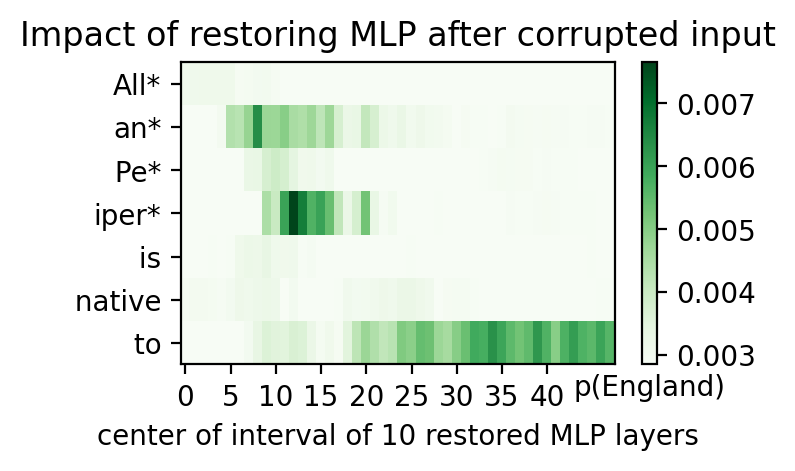

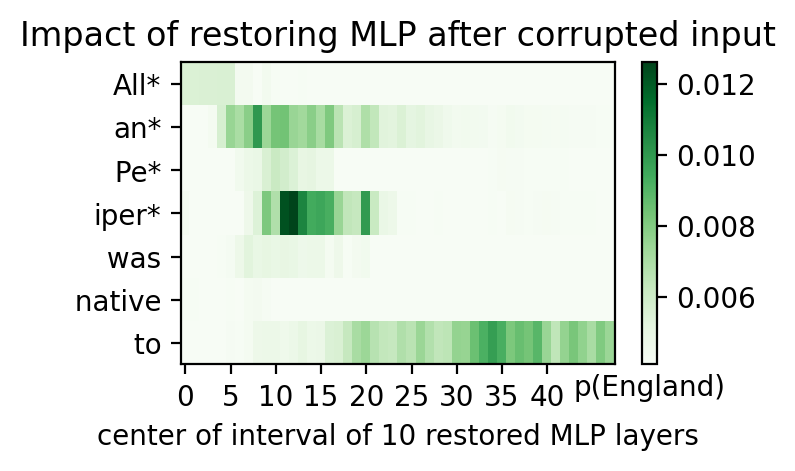

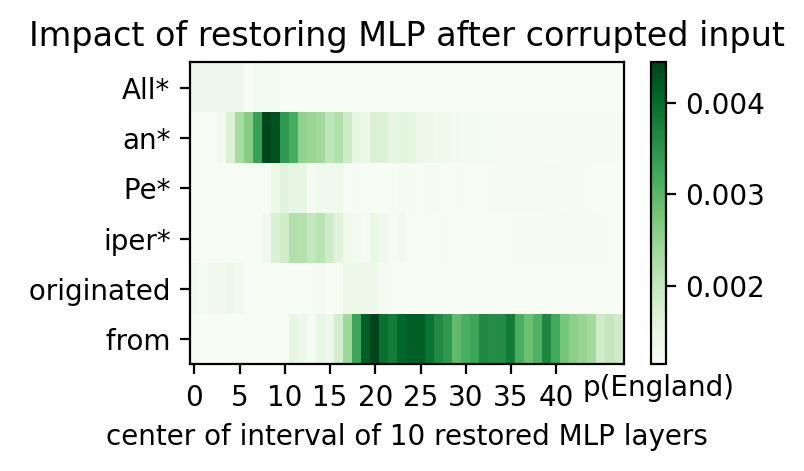

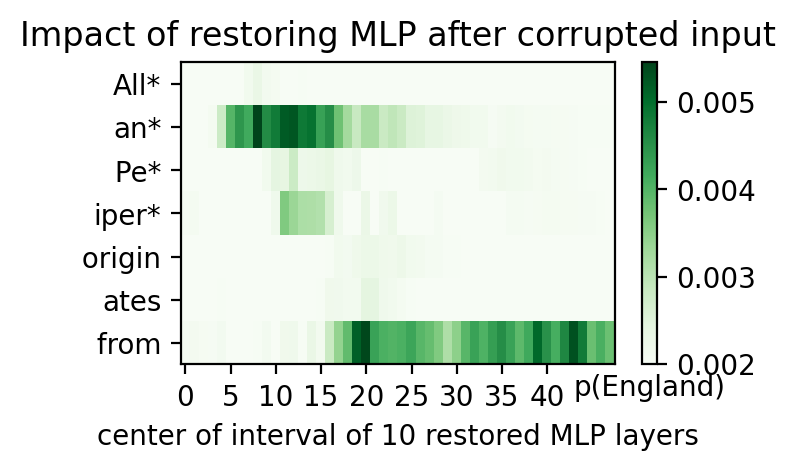

Plotting results for subject Paul Mounsey...


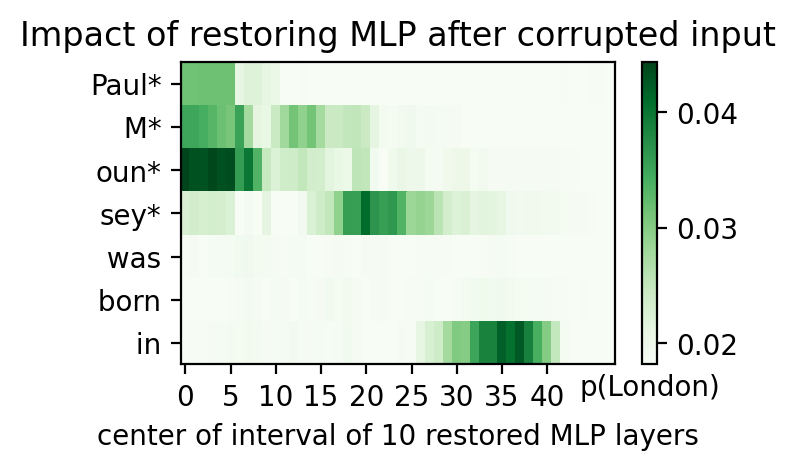

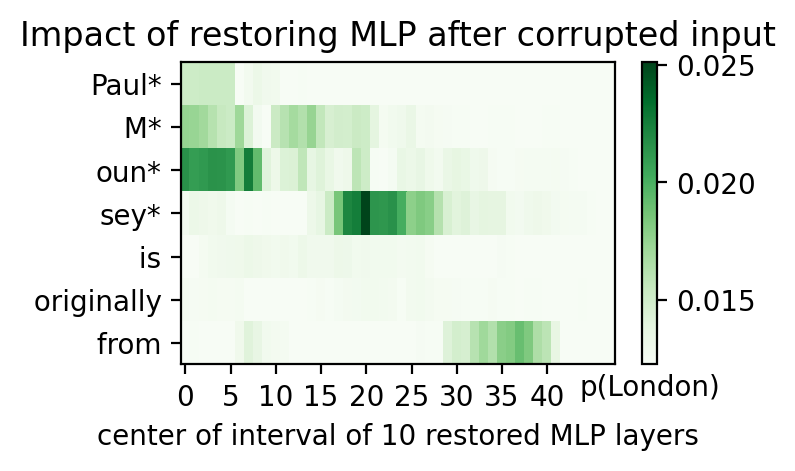

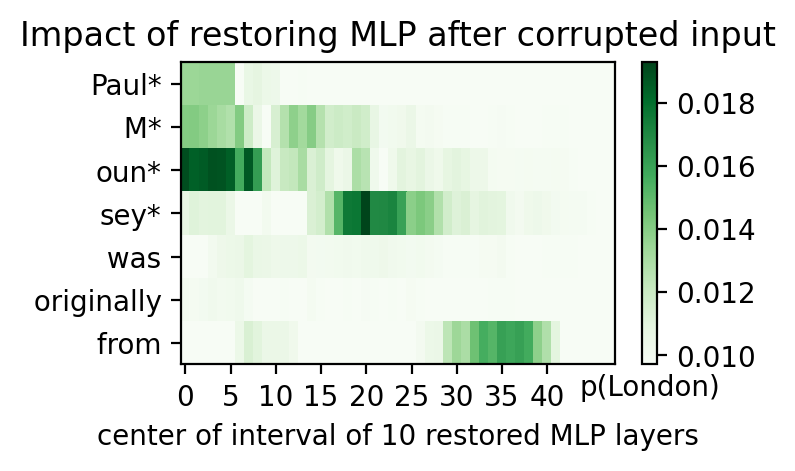

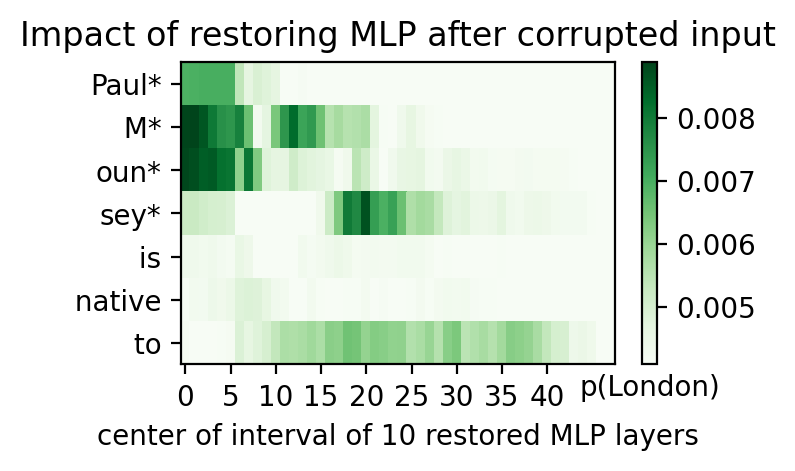

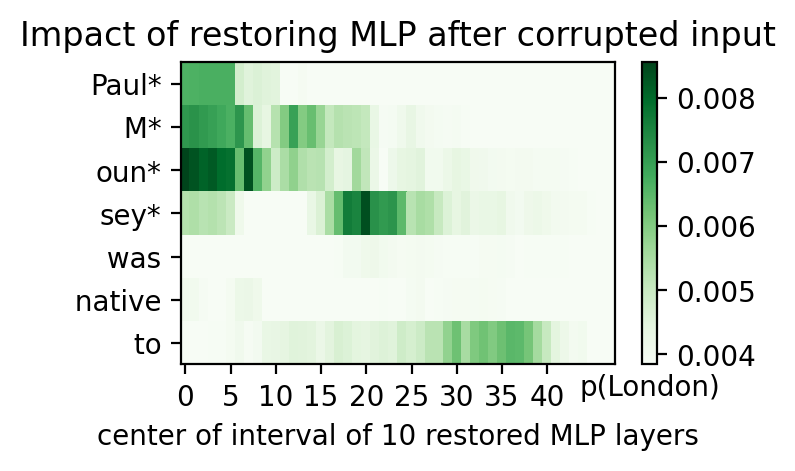

...

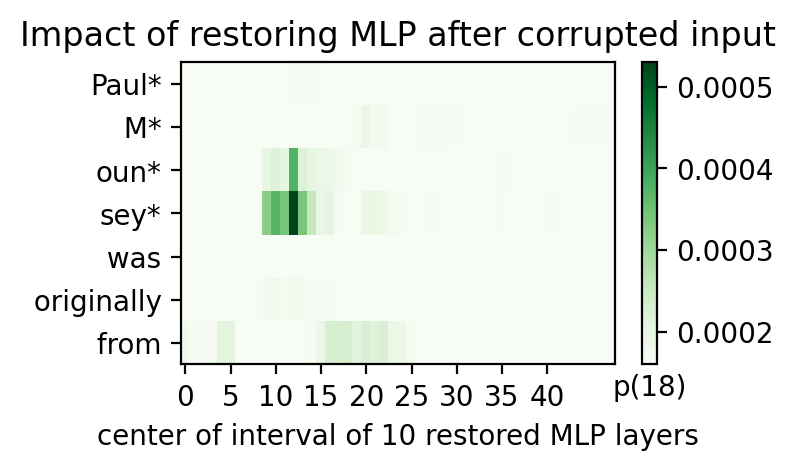

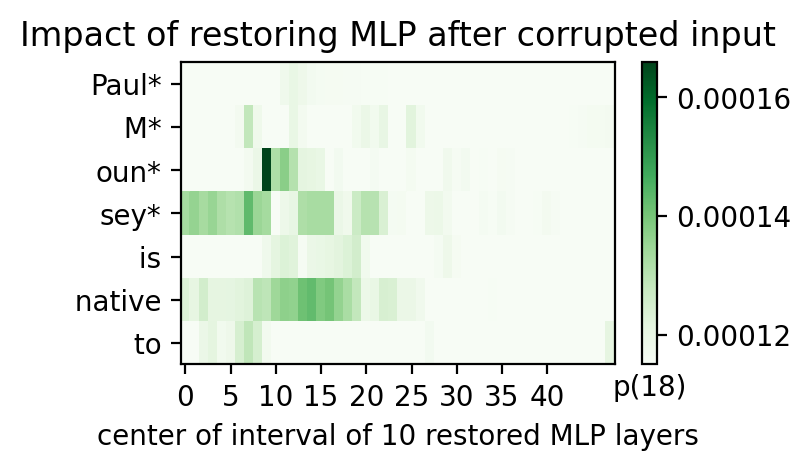

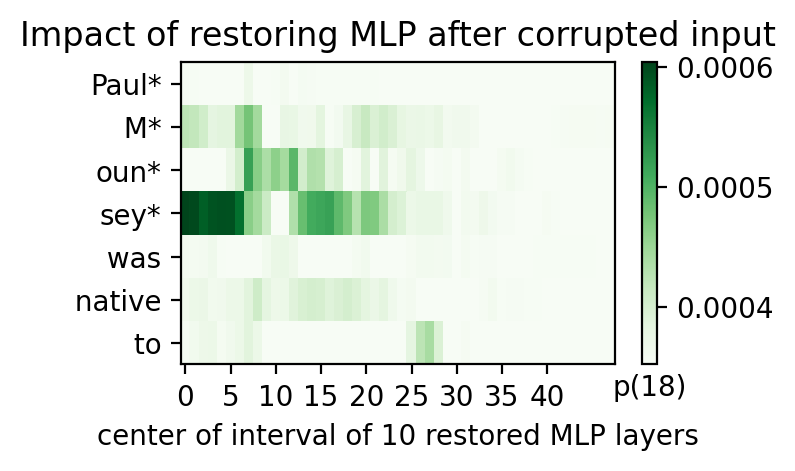

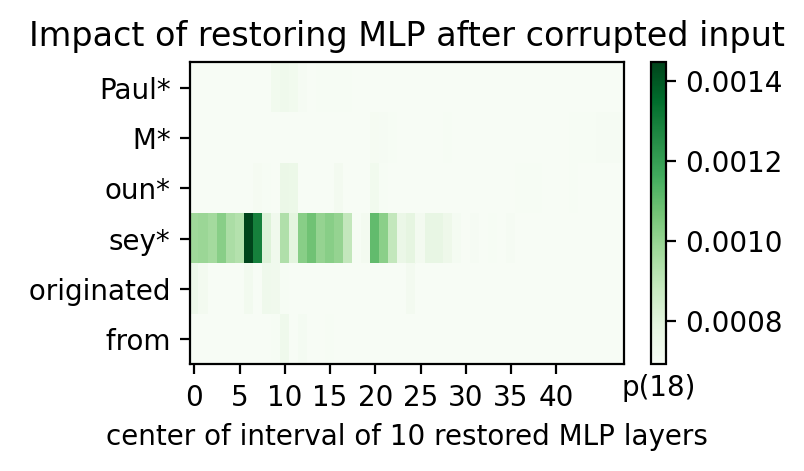

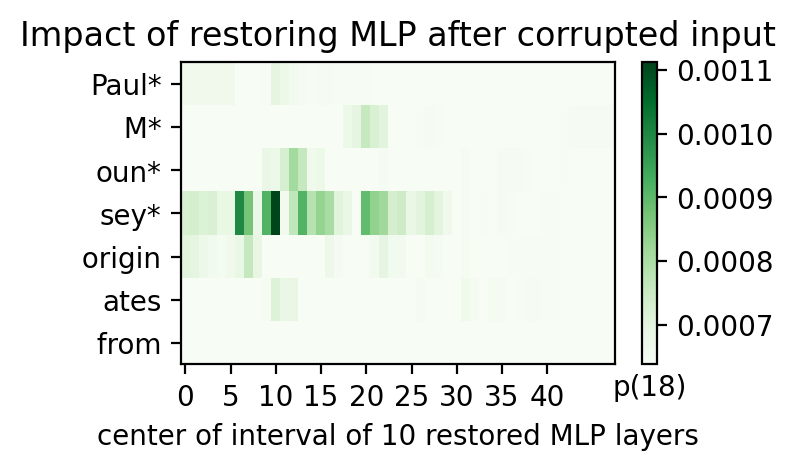

Plotting results for subject Moe Koffman...


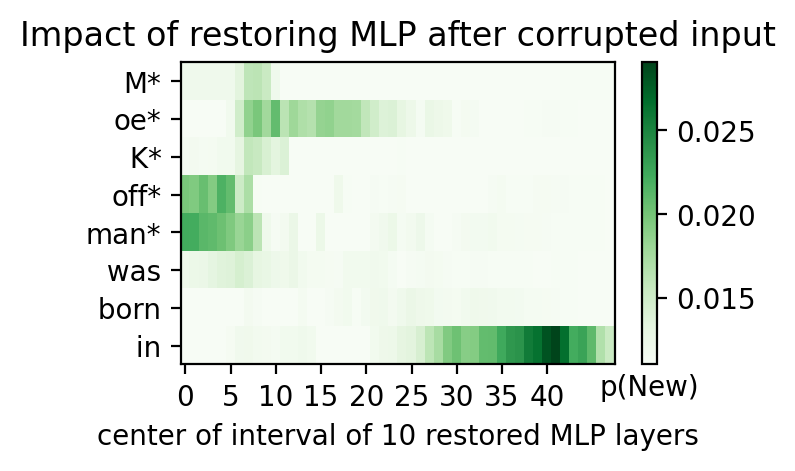

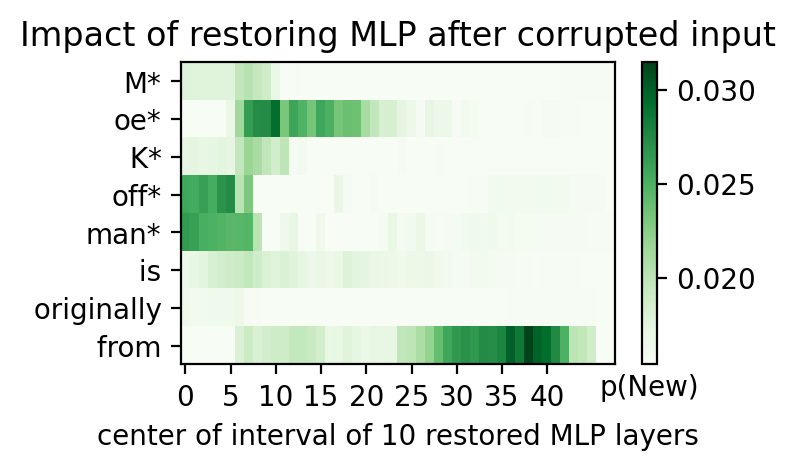

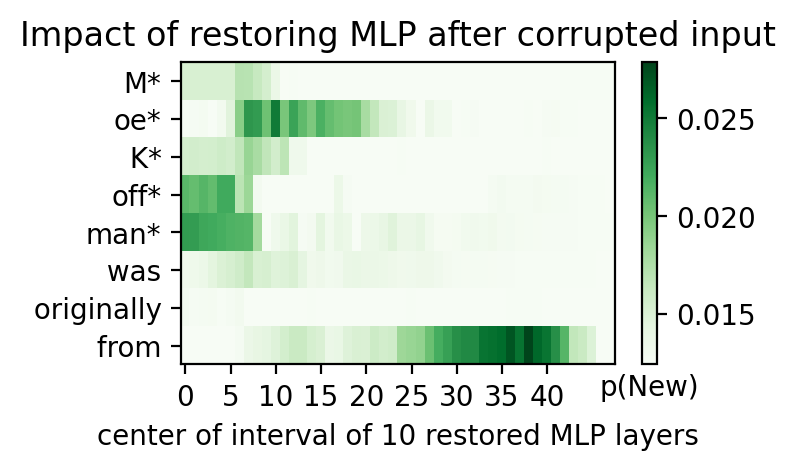

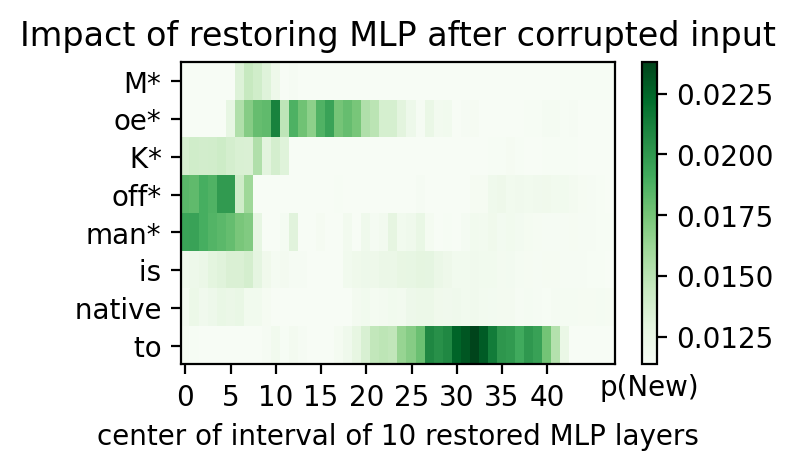

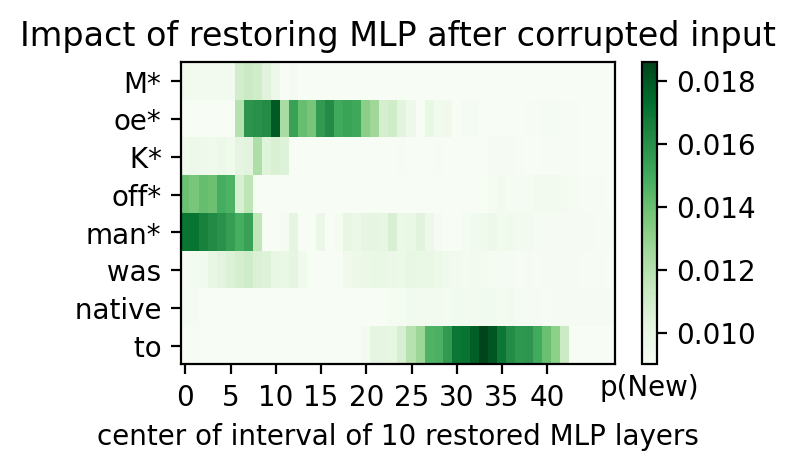

...

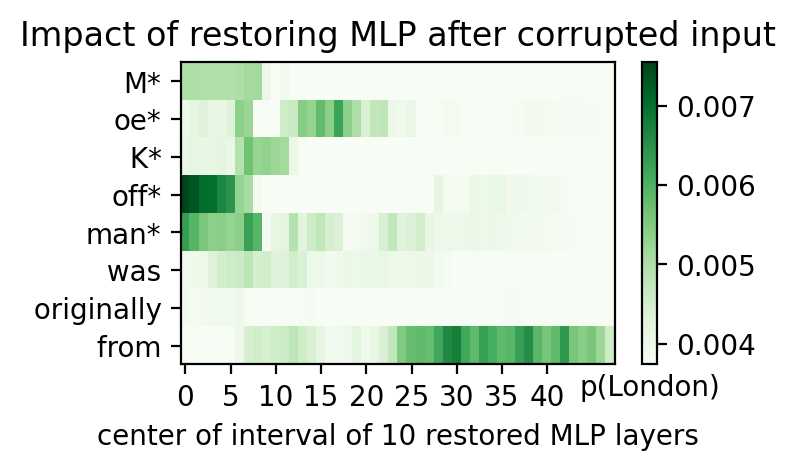

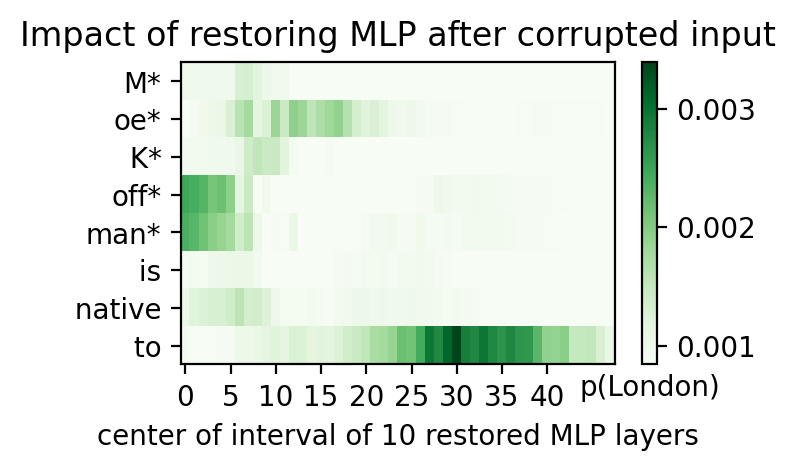

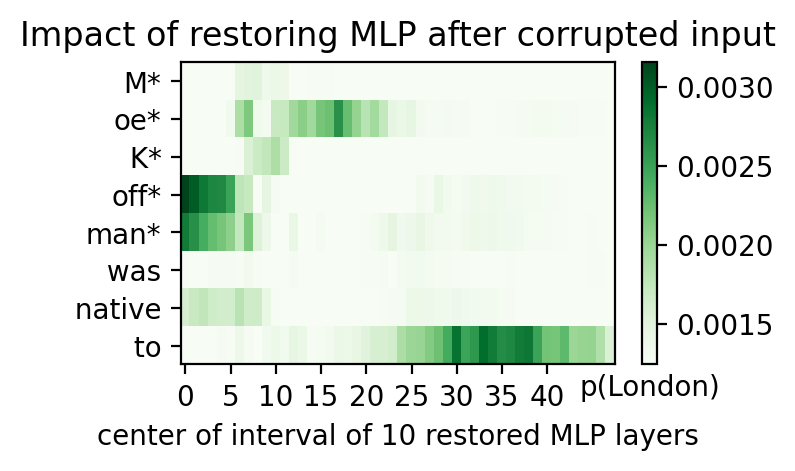

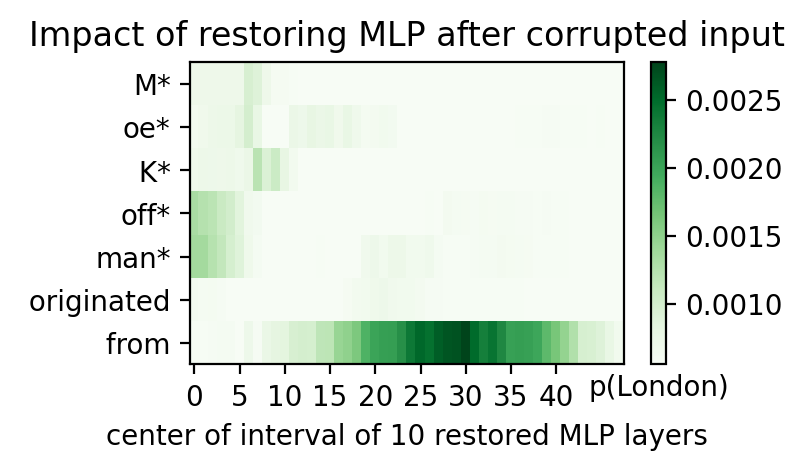

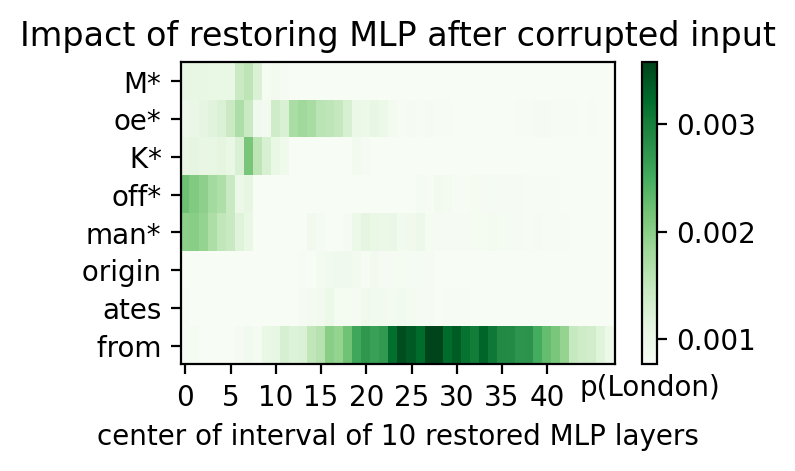

In [6]:
for subject in queries.subject.unique()[:3]:
    sample_ixs = list(queries[queries.subject==subject].index)
    print(f"Plotting results for subject {subject}...")
    for token_ix in range(len(queries.loc[sample_ixs[0]]["top10_tokens"])):
        for sample_ix in sample_ixs:
            results = np.load(os.path.join(results_folder, f"cases/{sample_ix}_any_mlp.npz"), allow_pickle=True)
            differences = results["scores"][:,:,token_ix]
            low_score = results["low_score"][token_ix]
            answer = queries.loc[sample_ix]["top10_tokens"][token_ix]

            kind = str(results["kind"])
            window = results.get("window", 10)
            labels = list(results["input_tokens"])
            for i in range(*results["subject_range"]):
                labels[i] = labels[i] + "*"

            plot_trace_heatmap_from_values(differences, low_score, answer, kind, window, labels,
                                               savepdf=False, title=None, xlabel=None, modelname=None)

### Measure impact pattern similarities between paraphrases for the same output tokens

Also plots normalized TEs. 

Compare similarities in impactfulness distributions to answer:
- What token states are most important to recover (regardless of layer)?
    - First token, last token, any subject token, other (relation)?
- What layers are most important to recover for each token?
    - 0-48
- Across all layers and tokens
    - First token, last token, any subject token, other (relation)?

**TODO:**
Compare against null hypothesis values, e.g. other query distributions and uniform distributions.    


In [44]:
def get_token_scores(results, token_ix):
    subject_tokens_ix = list(range(*results["subject_range"]))
    scores = results["scores"][:,:,token_ix]
    other_tokens_ix = list(set(range(len(results["input_tokens"])))-set(subject_tokens_ix)-{0}-{len(results["input_tokens"])-1})

    token_scores = np.concatenate((scores.sum(axis=1)[subject_tokens_ix], [scores.sum(axis=1)[0]], [scores.sum(axis=1)[-1]], [scores.sum(axis=1)[other_tokens_ix].mean()]))
    token_scores = token_scores/token_scores.sum()
    
    return token_scores

def get_layer_scores(results, token_ix):
    subject_tokens_ix = list(range(*results["subject_range"]))
    scores = results["scores"][:,:,token_ix]
    other_tokens_ix = list(set(range(len(results["input_tokens"])))-set(subject_tokens_ix)-{0}-{len(results["input_tokens"])-1})
    
    layer_scores = []
    for ix in subject_tokens_ix:
        layer_scores.append(scores[ix,:])
        layer_scores[-1] = layer_scores[-1]/sum(layer_scores[-1])
    layer_scores.append(scores[0,:]/sum(scores[0,:]))
    layer_scores.append(scores[-1,:]/sum(scores[-1,:]))
    layer_scores.append(scores[other_tokens_ix,:].mean(axis=0)/sum(scores[other_tokens_ix,:].mean(axis=0)))
    layer_scores = np.array(layer_scores)
    
    return layer_scores

def get_token_layer_scores(results, token_ix):
    subject_tokens_ix = list(range(*results["subject_range"]))
    scores = results["scores"][:,:,token_ix]
    other_tokens_ix = list(set(range(len(results["input_tokens"])))-set(subject_tokens_ix)-{0}-{len(results["input_tokens"])-1})
    
    token_layer_scores = np.concatenate([scores[ix,:] for ix in subject_tokens_ix]+[scores[0,:], scores[-1,:], scores[other_tokens_ix,:].mean(axis=0)])
    token_layer_scores = token_layer_scores.flatten()/token_layer_scores.flatten().sum()
    
    return token_layer_scores

def get_kl_dict_entry(results, results_to_compare, token_ix, token_ix_to_compare, curr_token, curr_token_to_compare, make_plots):
    dict_entry = {}
    
    # measure KL div for what token state is most important to recover
    # distrib over token pos
    subject_tokens_ix = list(range(*results["subject_range"]))
    distrib_tokens = [f"subject_{i}" for i in subject_tokens_ix]+["first", "last", "other"]
    token_scores = get_token_scores(results, token_ix)

    kl_div = sum(scipy.special.rel_entr(get_token_scores(results_to_compare, token_ix_to_compare), token_scores))
    dict_entry["token_importance_div"] = kl_div

    if make_plots:
        plt.bar(x=list(range(len(distrib_tokens))), height=token_scores, tick_label=distrib_tokens)
        plt.xticks(rotation=50)
        plt.show()
        print(f"KL divergence between different token importances for LAMA prompt and for this prompt is {kl_div}")

    # measure KL div for what layer is most important to recover for each token
    layer_scores = get_layer_scores(results, token_ix)
    layer_scores_to_compare = get_layer_scores(results_to_compare, token_ix_to_compare)

    kl_div = {}
    for ix, token in enumerate(distrib_tokens):
        kl_div[token] = sum(scipy.special.rel_entr(layer_scores_to_compare[ix], layer_scores[ix]))
    # store KL divergence values across layers for each token part
    for key, value in kl_div.items():
        dict_entry[f"layer_importance_div_{key}".replace("0", "first").replace(str(len(subject_tokens_ix)-1), "last")] = value

    if make_plots:
        plot_data = pd.DataFrame(layer_scores, index=distrib_tokens)
        cols = list(plot_data.columns)
        plot_data = plot_data.reset_index()
        plot_data = pd.melt(plot_data, id_vars="index", value_vars=cols)
        plot_data["prompt"] = (" ").join(results["input_tokens"])+f" ({curr_token})"

        plot_data_to_compare = pd.DataFrame(layer_scores_to_compare, index=distrib_tokens)
        plot_data_to_compare = plot_data_to_compare.reset_index()
        plot_data_to_compare = pd.melt(plot_data_to_compare, id_vars="index", value_vars=cols)
        plot_data_to_compare["prompt"] = (" ").join(results_to_compare["input_tokens"])+f" ({curr_token_to_compare})"

        plot_data_tot = pd.concat((plot_data, plot_data_to_compare), ignore_index=True)
        for token in distrib_tokens:
            plt.figure(figsize=(15, 5))
            sns.barplot(data=plot_data_tot[plot_data_tot['index']==token], x="variable", y="value", hue="prompt")
            plt.title(f"Layer importances for input token {token}")
            plt.show()

        print(f"KL divergences between different layer importances for different input tokens for other prompt and this prompt are:")
        print(kl_div)

    # measure KL div across all important token positions
    token_layer_scores = get_token_layer_scores(results, token_ix)
    token_layer_scores_to_compare = get_token_layer_scores(results_to_compare, token_ix_to_compare)
    dict_entry["all_token_layers_importance_div"] = sum(scipy.special.rel_entr(token_layer_scores_to_compare, token_layer_scores))

    return dict_entry

Currently make the baseline comparison against the same query but for another output token (to match the subject length). Could also sample over paraphrases? 

DIVERGENCES VERY SIMILAR??

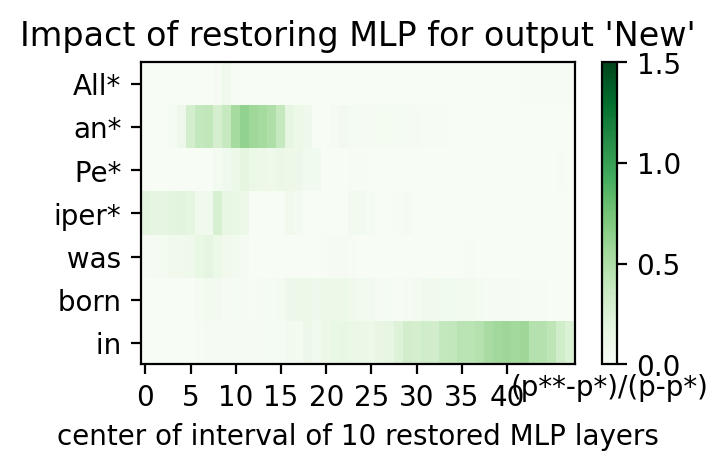

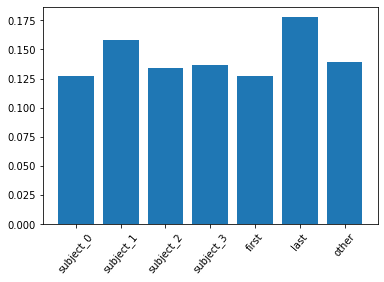

KL divergence between different token importances for LAMA prompt and for this prompt is 0.0


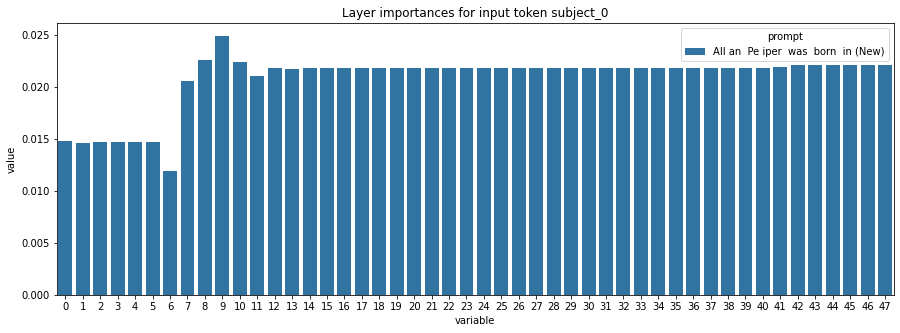

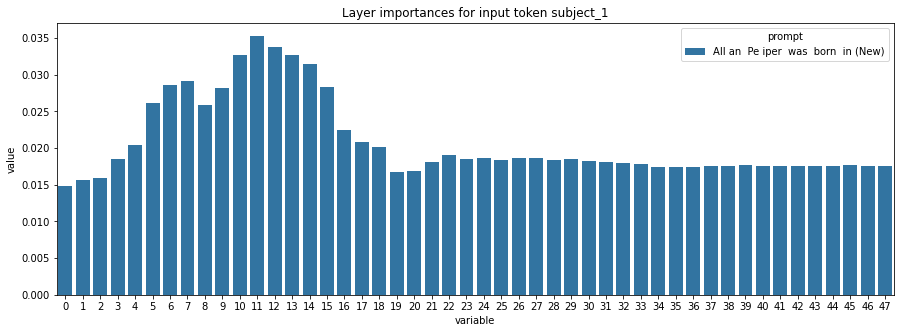

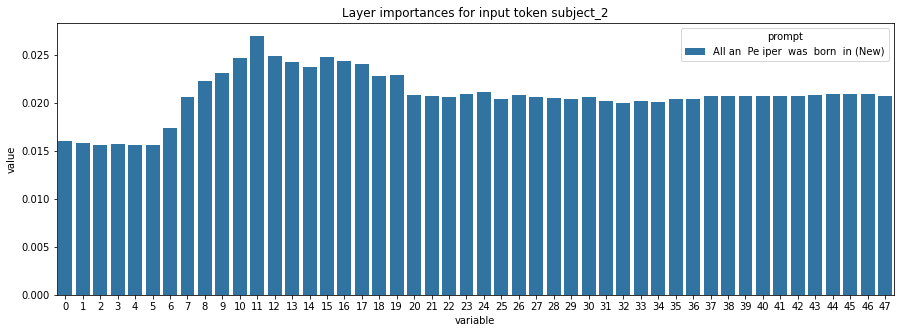

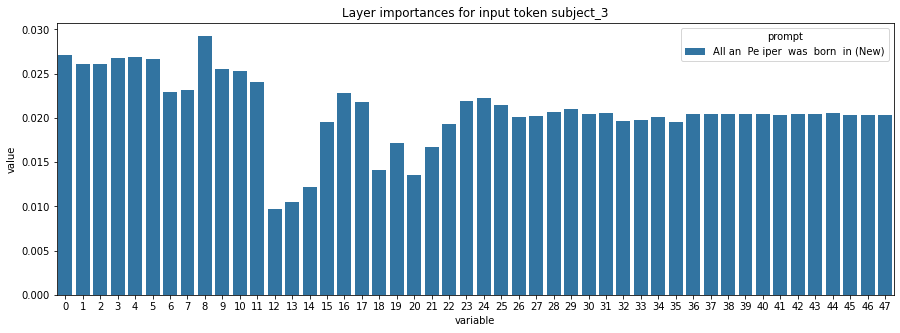

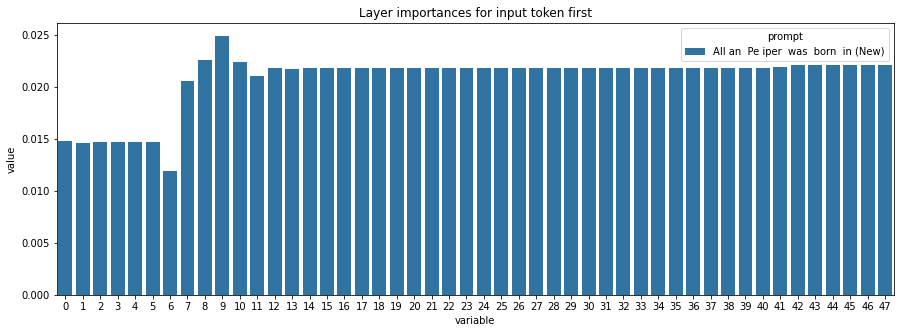

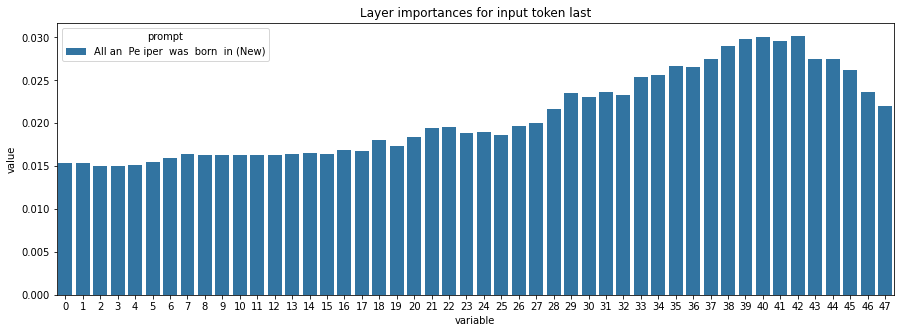

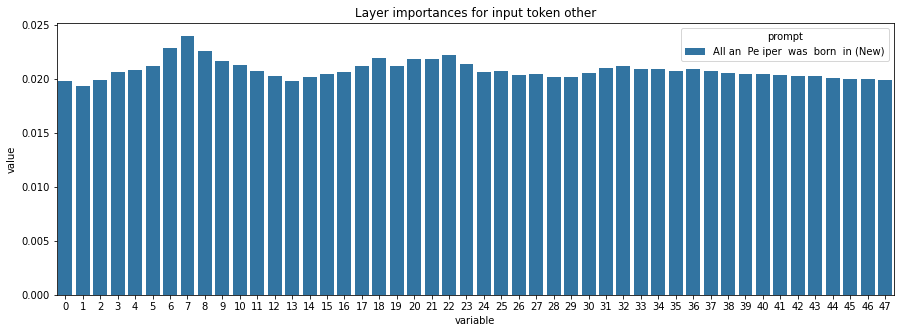

KL divergences between different layer importances for different input tokens for other prompt and this prompt are:
{'subject_0': 0.0, 'subject_1': 0.0, 'subject_2': 0.0, 'subject_3': 0.0, 'first': 0.0, 'last': 0.0, 'other': 0.0}


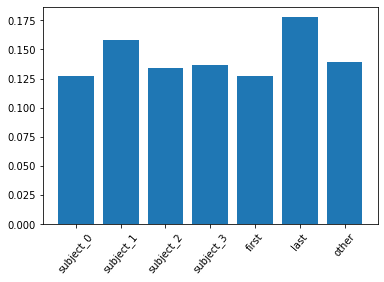

KL divergence between different token importances for LAMA prompt and for this prompt is 8.122986764647067e-05


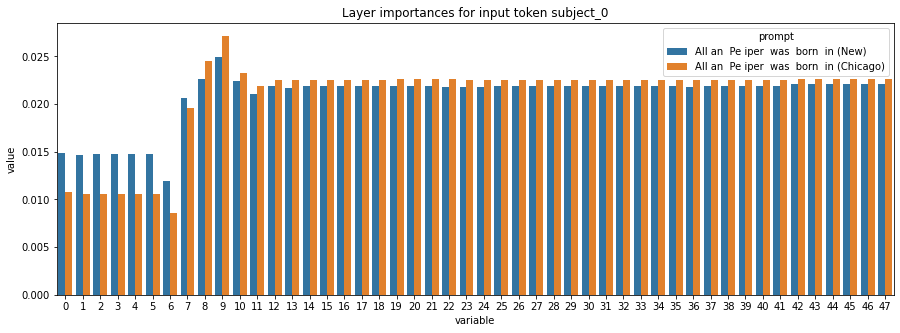

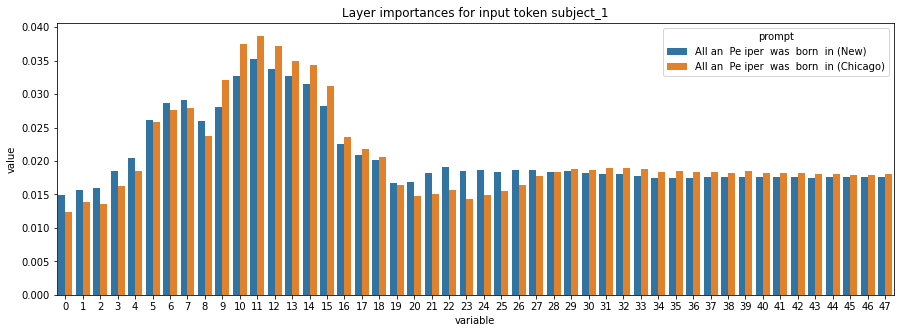

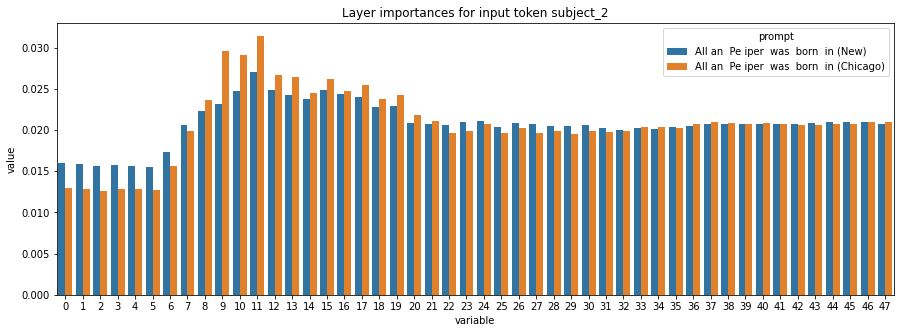

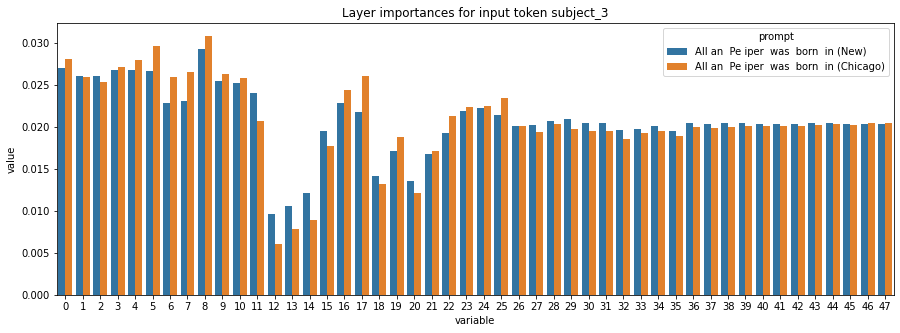

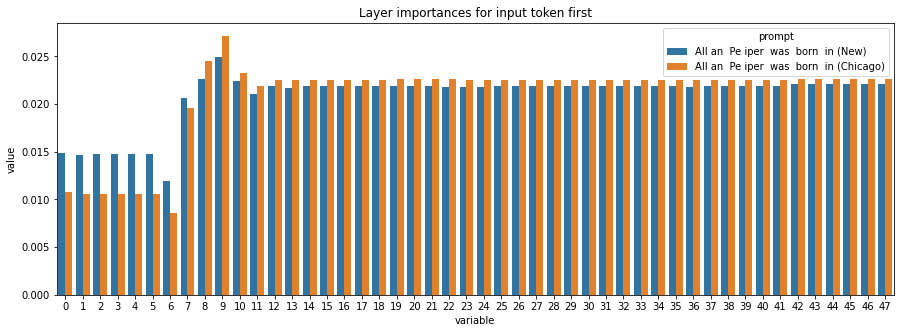

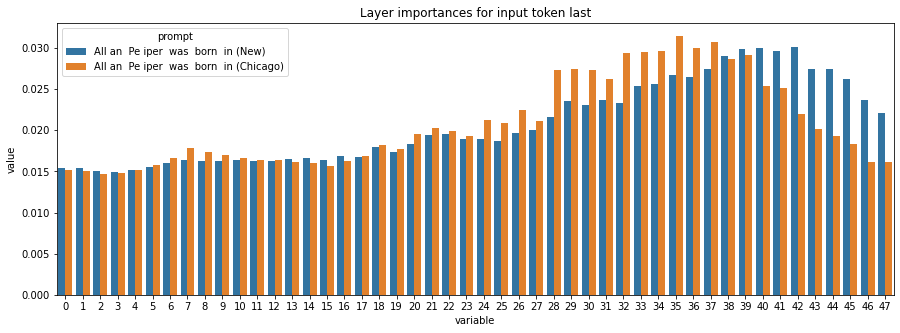

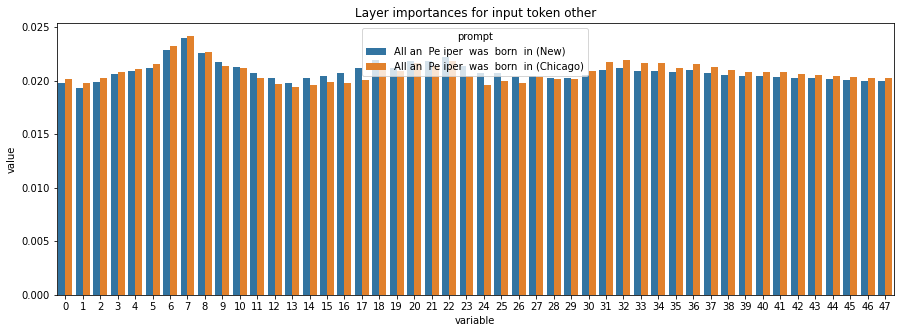

KL divergences between different layer importances for different input tokens for other prompt and this prompt are:
{'subject_0': 0.004938595200655982, 'subject_1': 0.004551154917862732, 'subject_2': 0.003952999759576414, 'subject_3': 0.003717585318554484, 'first': 0.004938595200655982, 'last': 0.012352202058536932, 'other': 0.0003044769982807338}


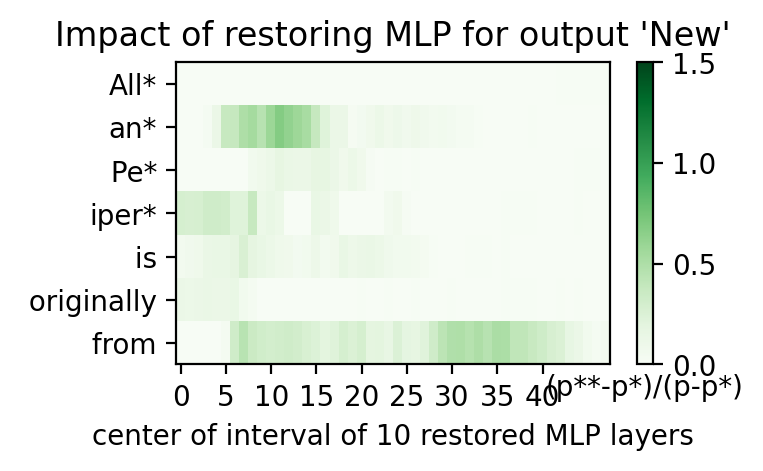

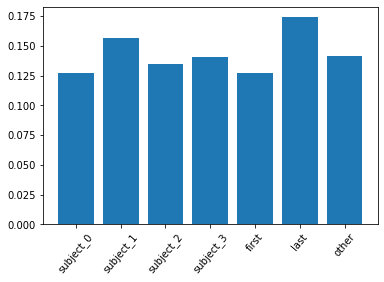

KL divergence between different token importances for LAMA prompt and for this prompt is 0.00011378887575119734


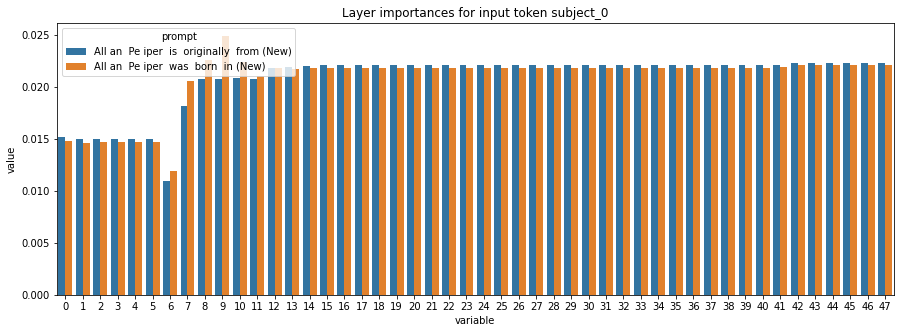

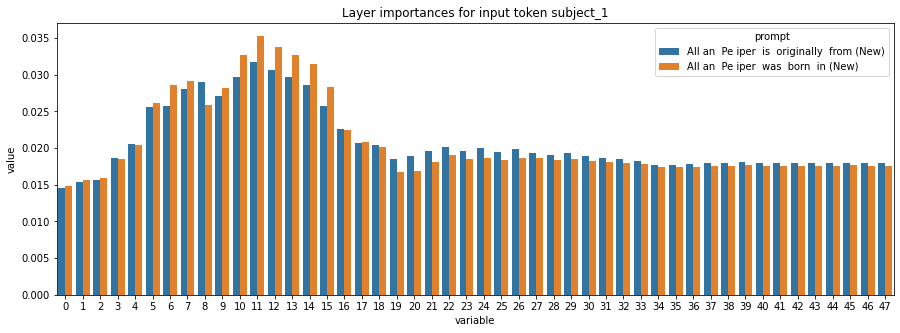

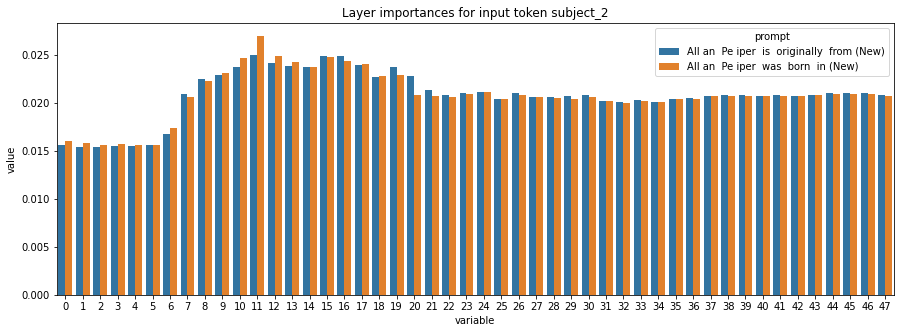

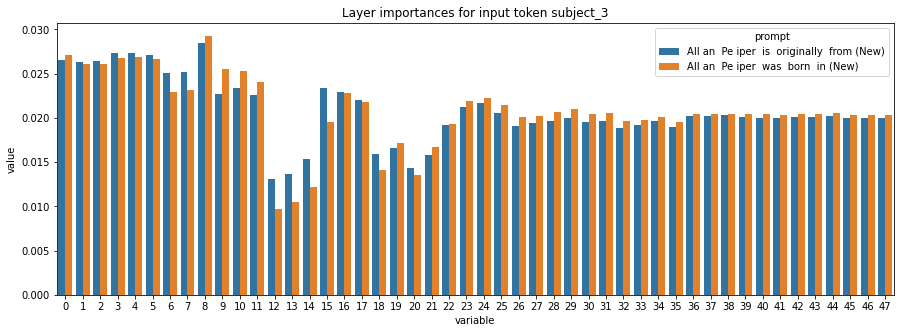

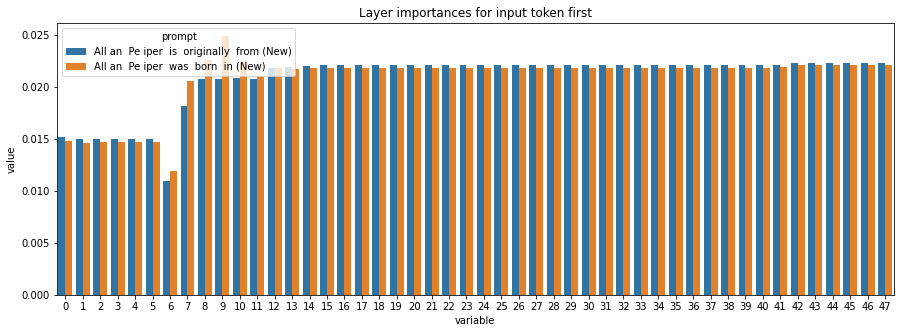

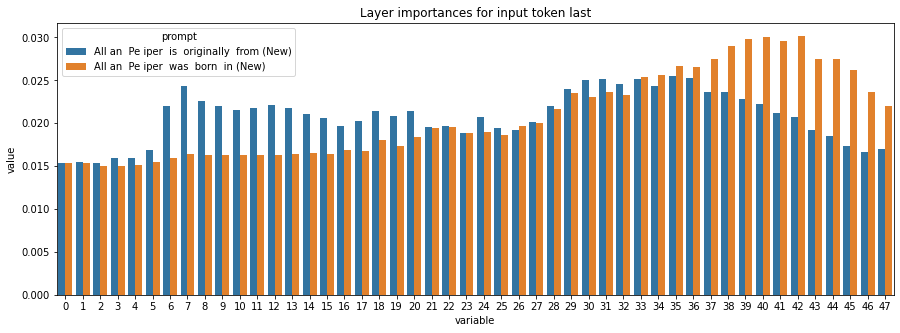

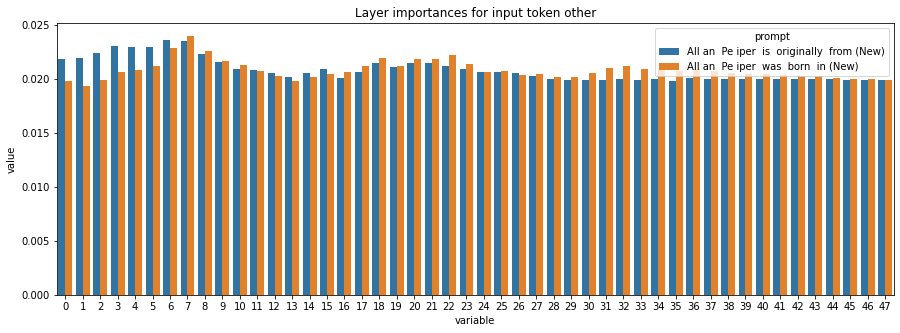

KL divergences between different layer importances for different input tokens for other prompt and this prompt are:
{'subject_0': 0.0007987412557781681, 'subject_1': 0.0018774091731756926, 'subject_2': 0.0002714316487981705, 'subject_3': 0.002482221207174007, 'first': 0.0007987412557781681, 'last': 0.02384825499211729, 'other': 0.0010186105955654057}


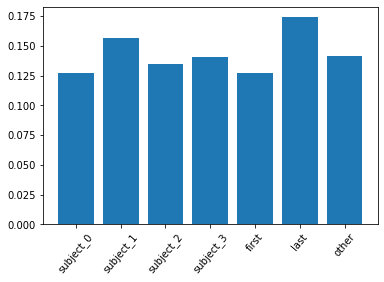

KL divergence between different token importances for LAMA prompt and for this prompt is 0.0024243700318038464


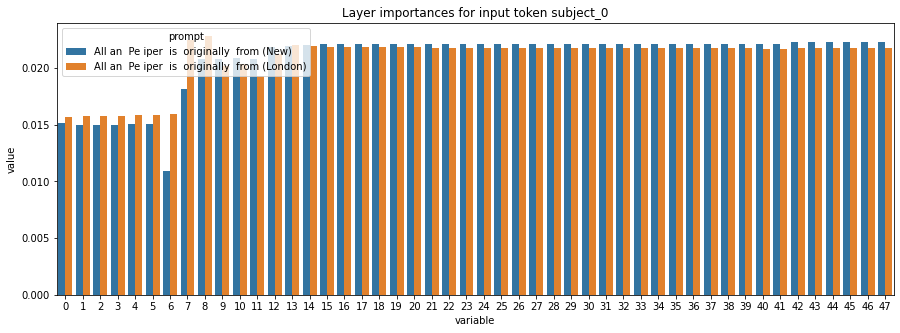

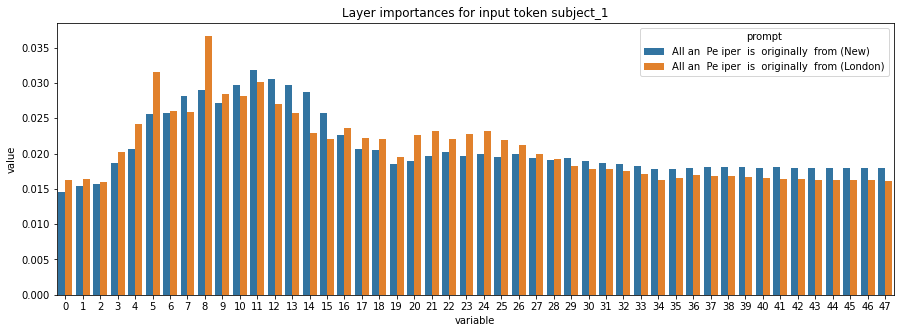

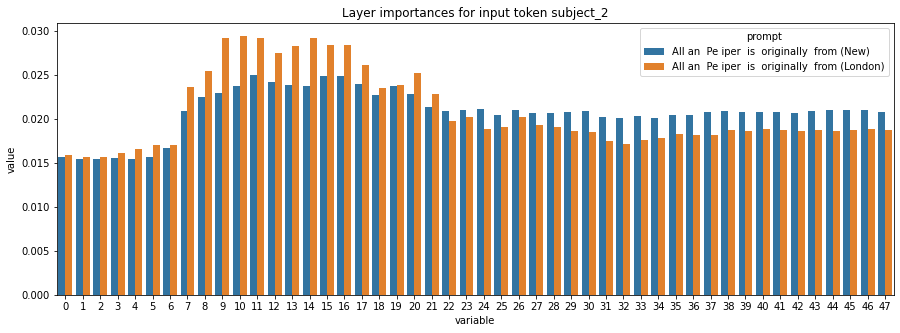

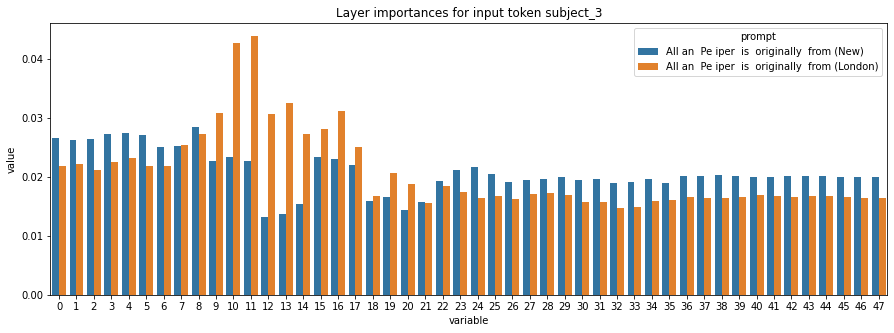

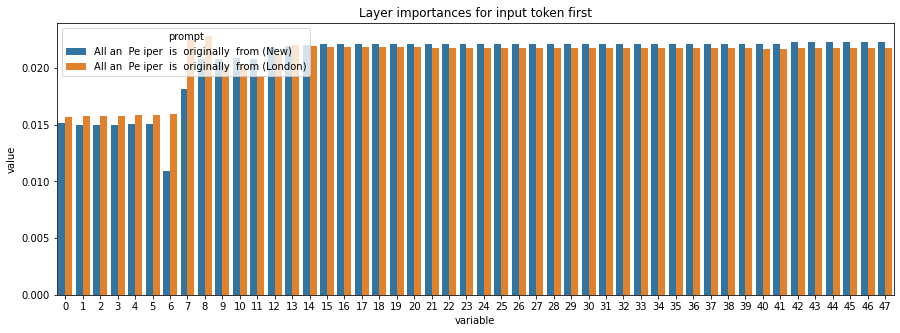

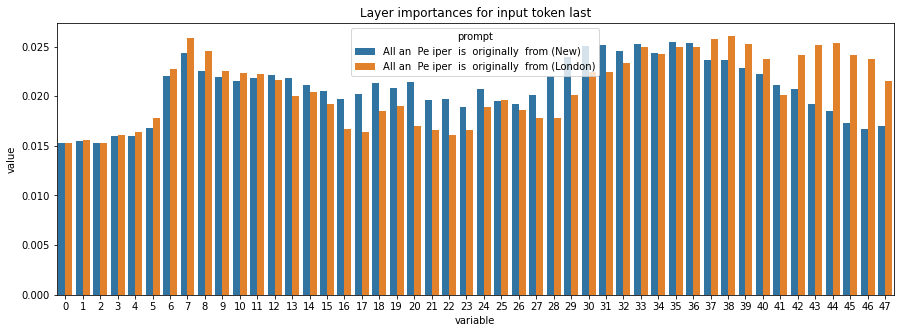

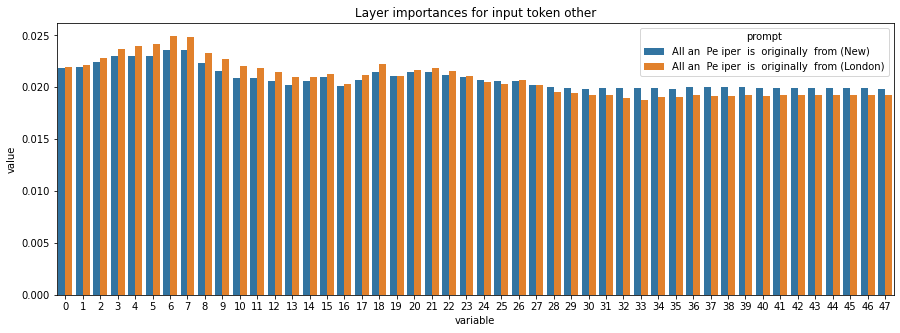

KL divergences between different layer importances for different input tokens for other prompt and this prompt are:
{'subject_0': 0.0018752686664811336, 'subject_1': 0.006286681382334791, 'subject_2': 0.007093058098689653, 'subject_3': 0.05172590189613402, 'first': 0.0018752686664811336, 'last': 0.009571290644089459, 'other': 0.000608494001426152}


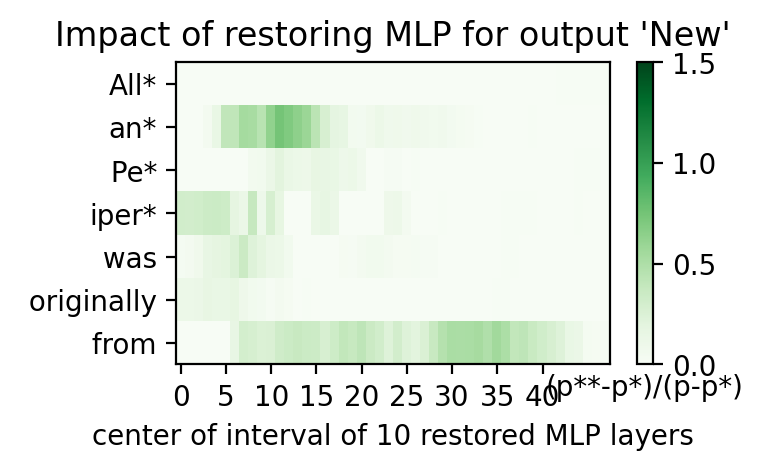

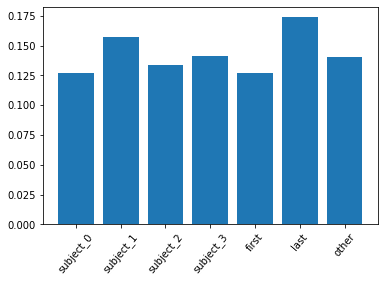

KL divergence between different token importances for LAMA prompt and for this prompt is 0.00013308468624018133


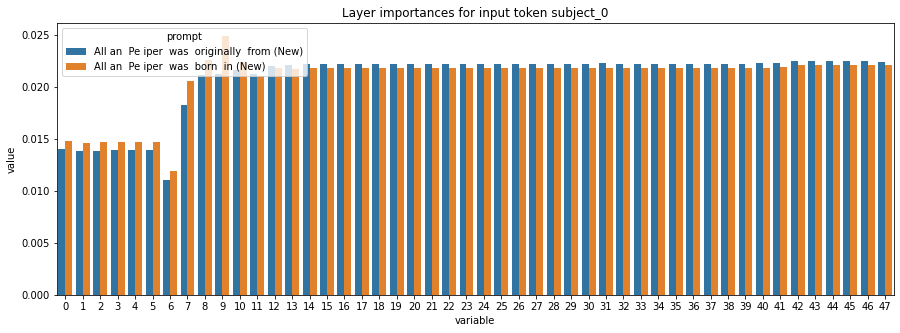

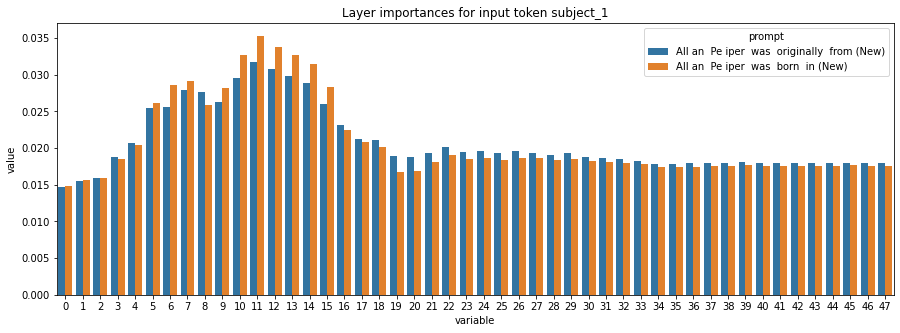

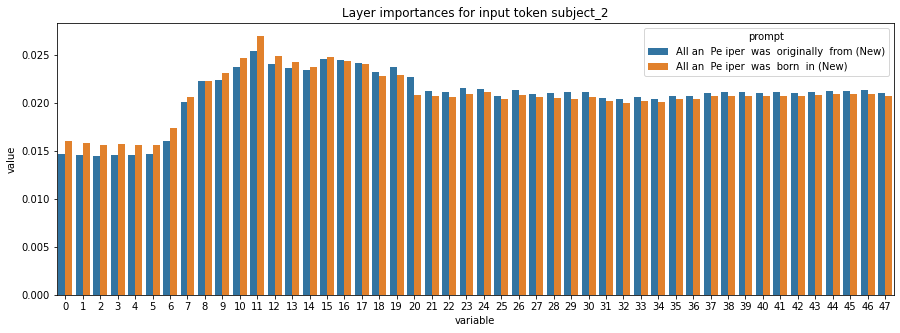

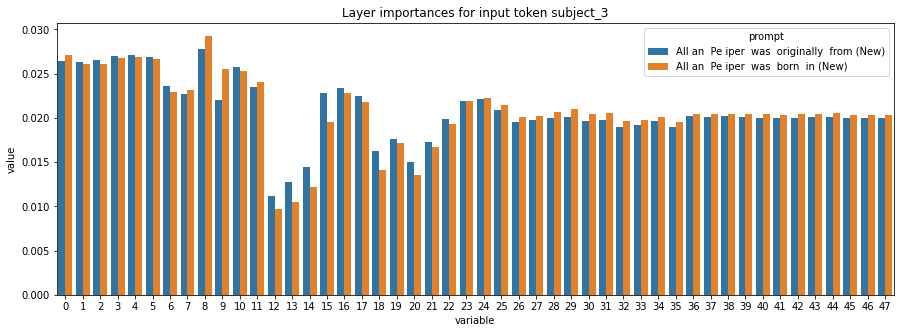

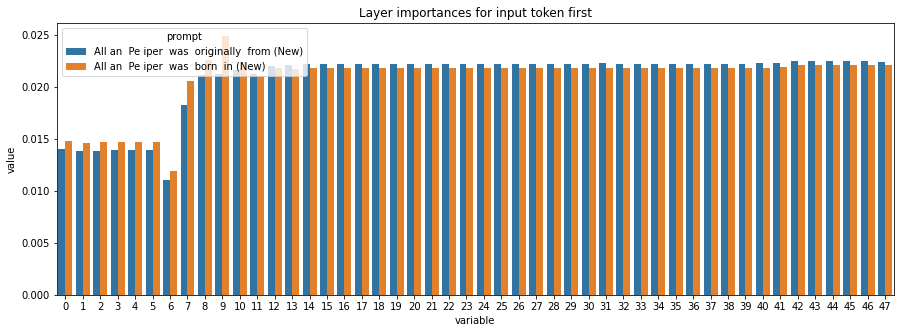

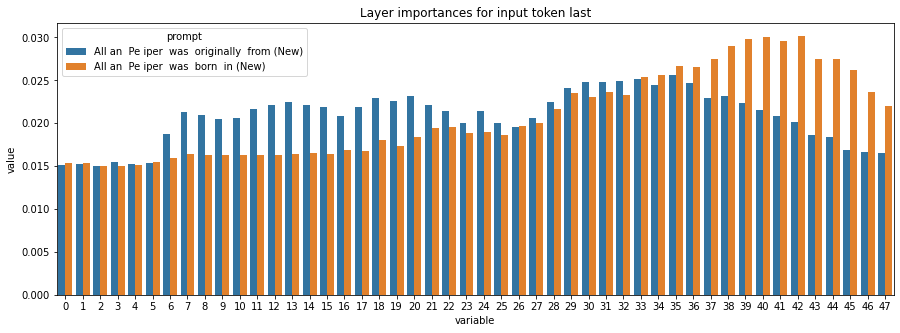

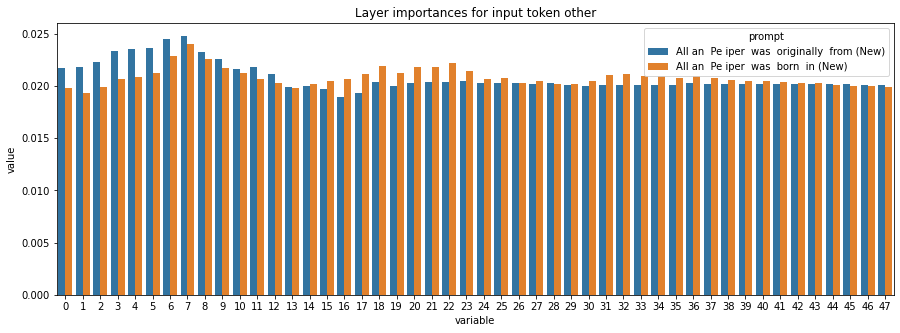

KL divergences between different layer importances for different input tokens for other prompt and this prompt are:
{'subject_0': 0.0008011563331820071, 'subject_1': 0.0017714674304443179, 'subject_2': 0.0006316314938885625, 'subject_3': 0.001510202687995843, 'first': 0.0008011563331820071, 'last': 0.0256684155210678, 'other': 0.0015806291667104233}


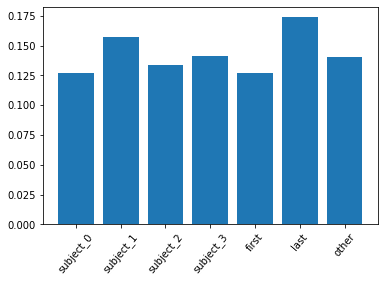

KL divergence between different token importances for LAMA prompt and for this prompt is 0.002633177791722119


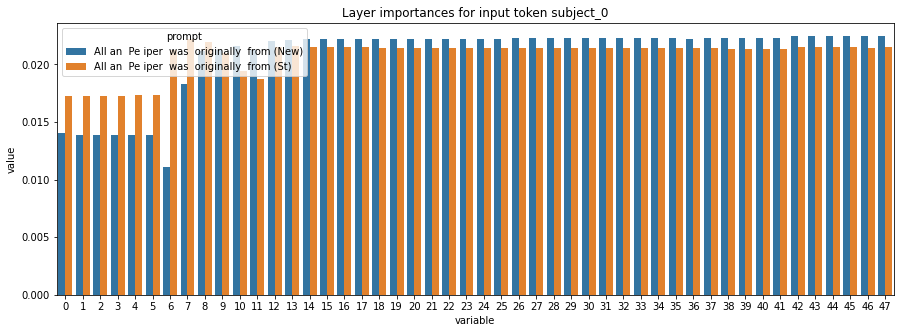

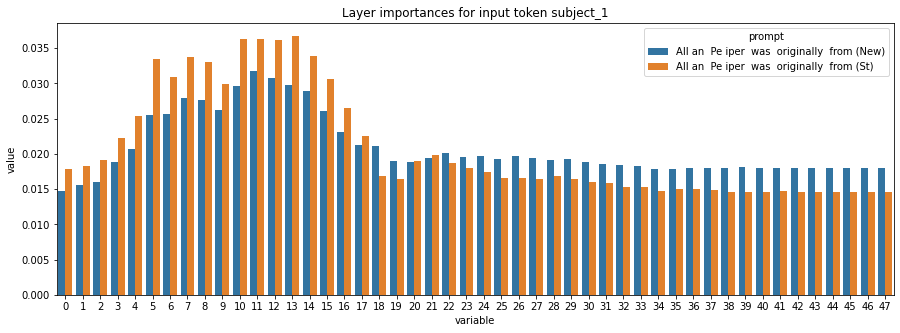

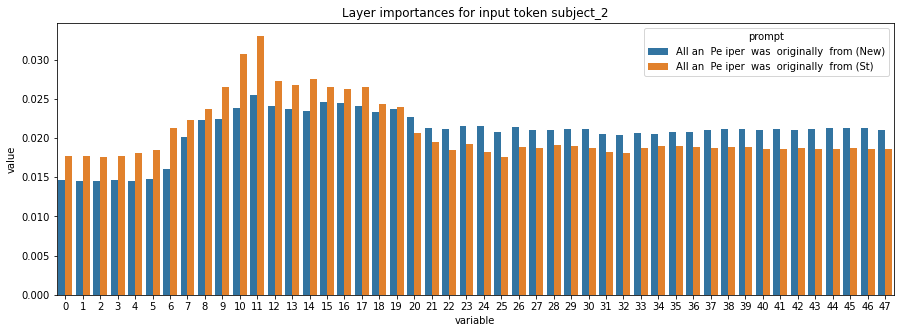

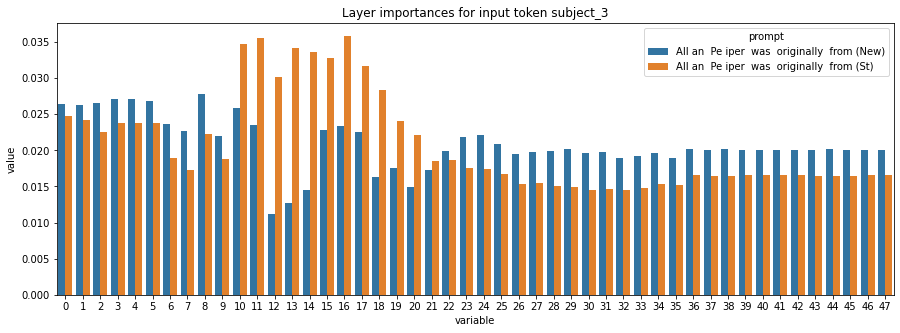

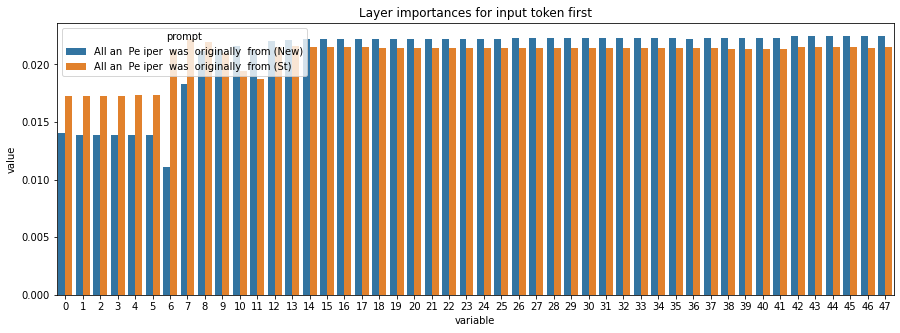

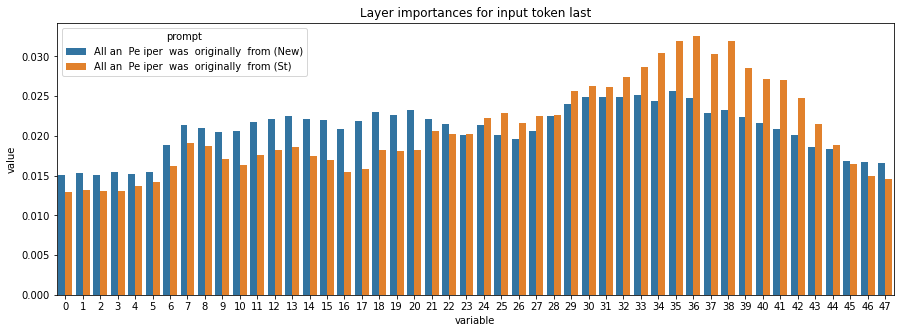

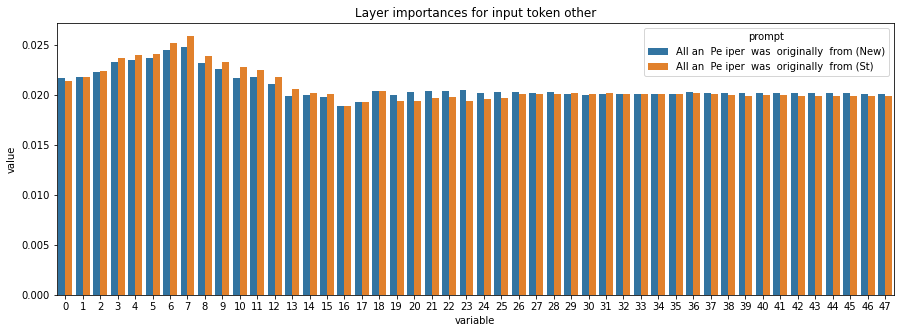

KL divergences between different layer importances for different input tokens for other prompt and this prompt are:
{'subject_0': 0.007188979390775785, 'subject_1': 0.015304442043998279, 'subject_2': 0.010190950415562838, 'subject_3': 0.06359431613236666, 'first': 0.007188979390775785, 'last': 0.016801494115497917, 'other': 0.0002580373138698633}


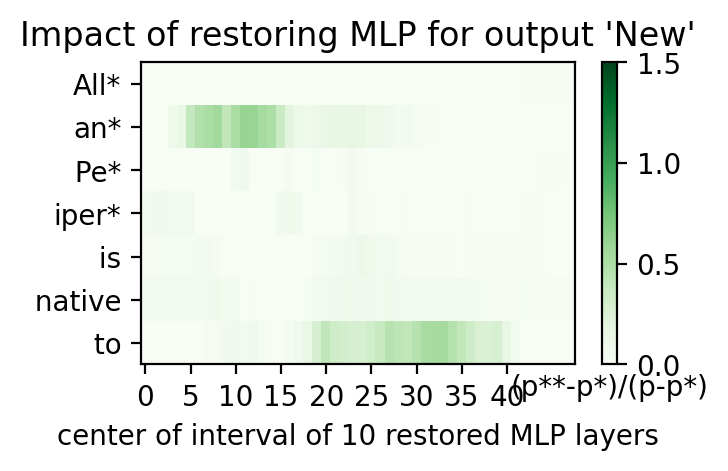

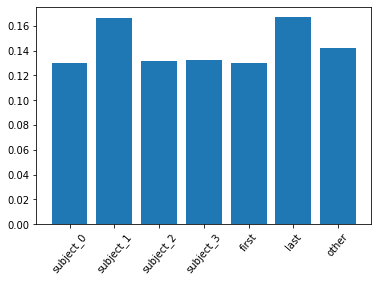

KL divergence between different token importances for LAMA prompt and for this prompt is 0.0007268192712217569


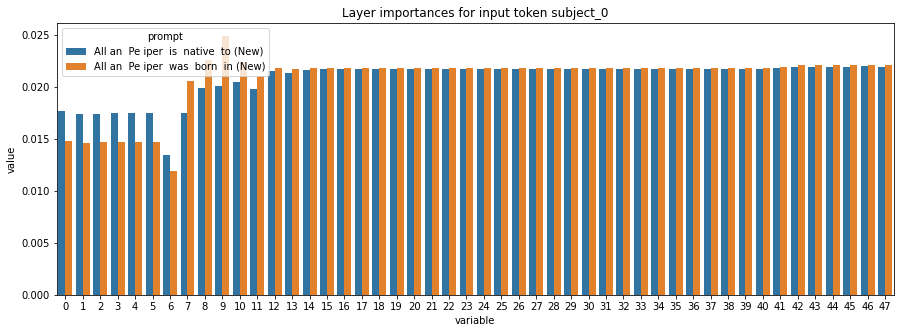

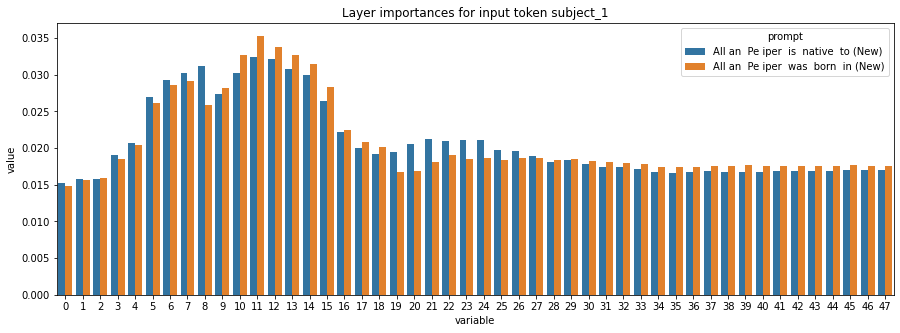

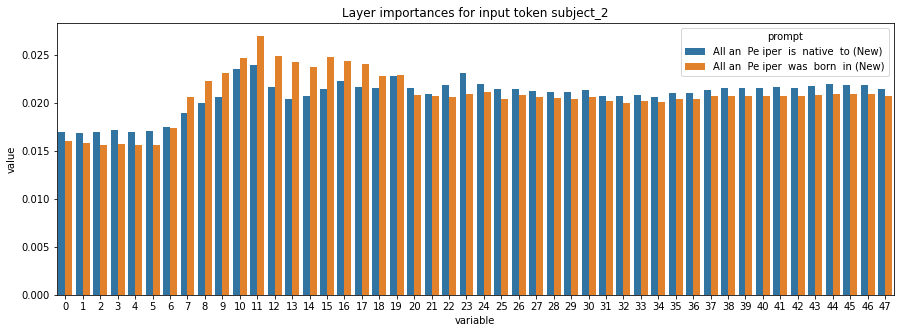

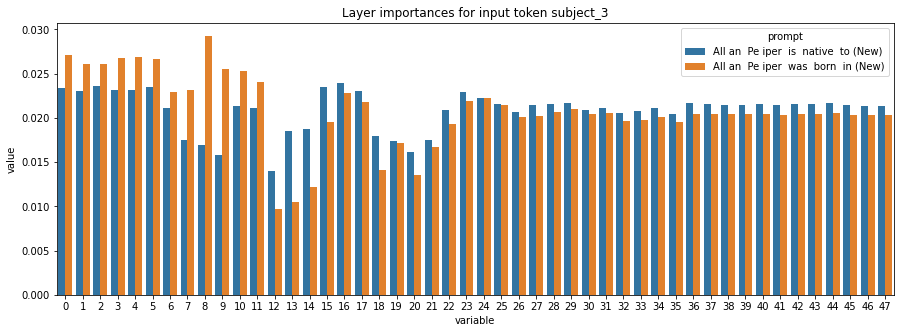

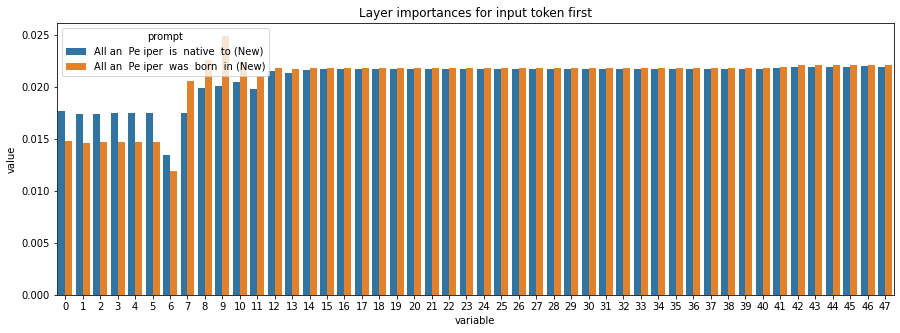

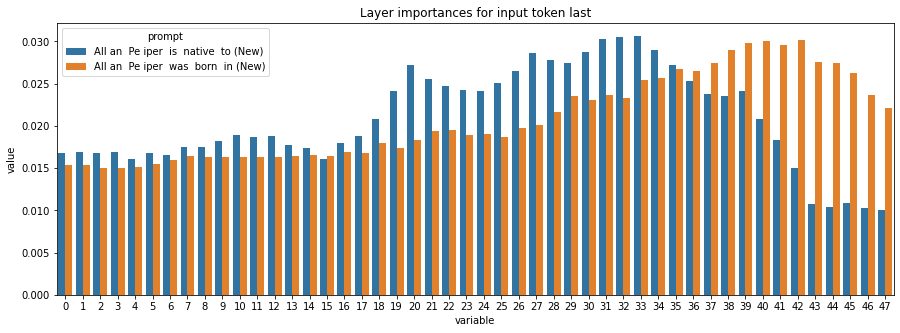

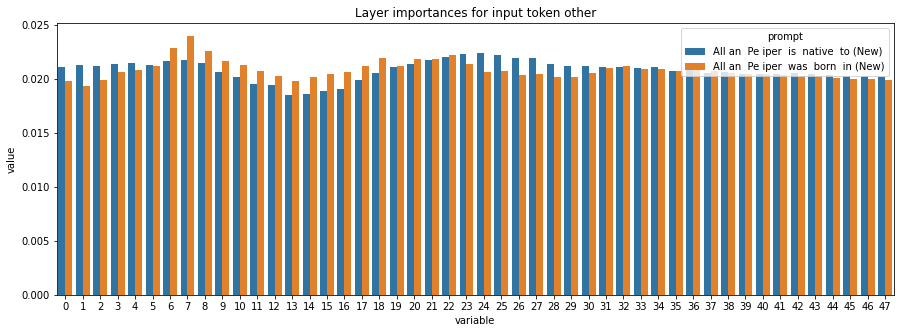

KL divergences between different layer importances for different input tokens for other prompt and this prompt are:
{'subject_0': 0.0025905214934027754, 'subject_1': 0.0025355216930620372, 'subject_2': 0.002664631392690353, 'subject_3': 0.014821442269749241, 'first': 0.0025905214934027754, 'last': 0.06444431218551472, 'other': 0.0011347617646606523}


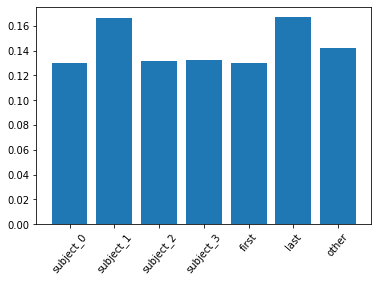

KL divergence between different token importances for LAMA prompt and for this prompt is 0.025806636083871126


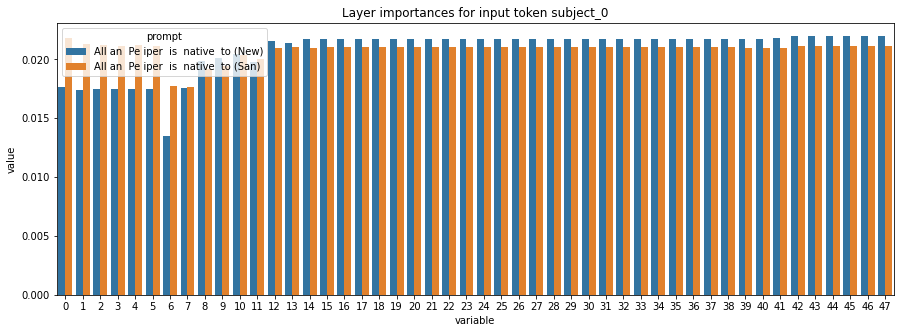

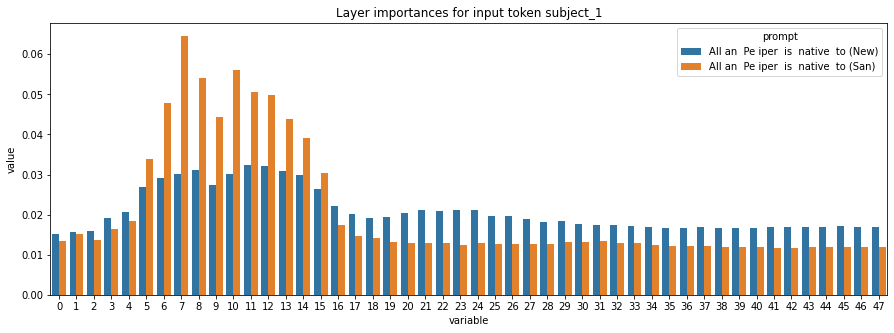

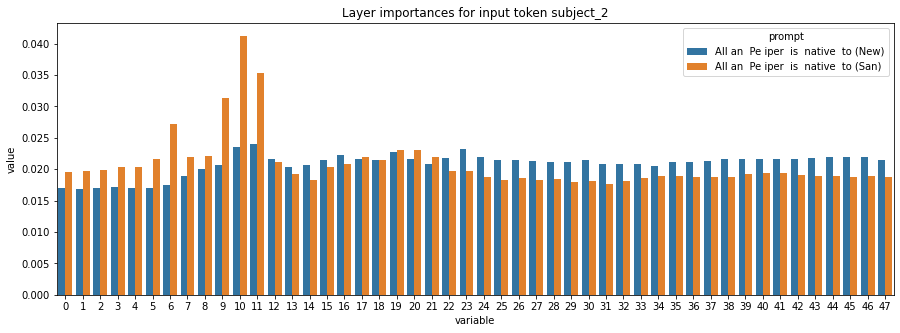

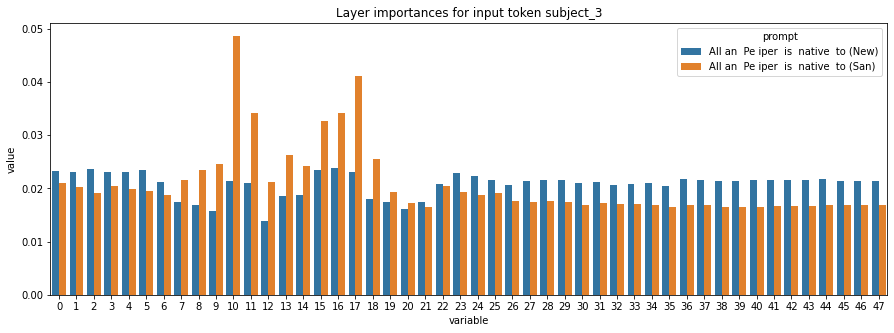

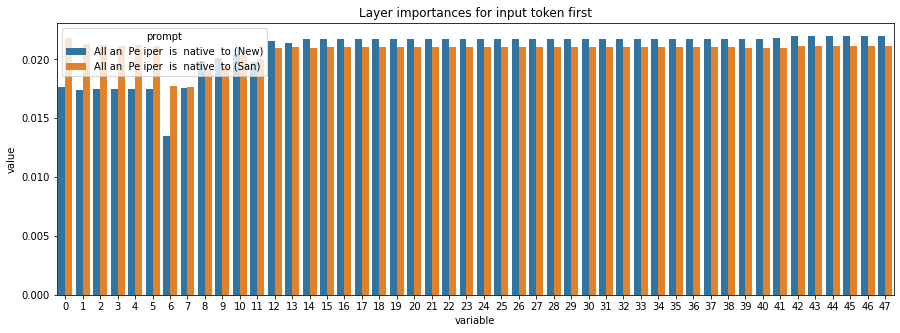

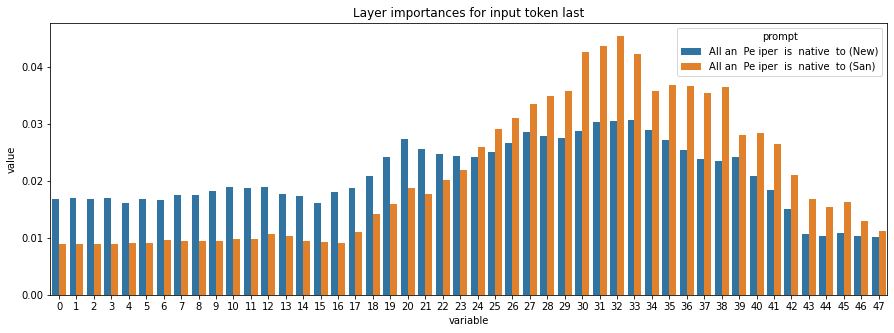

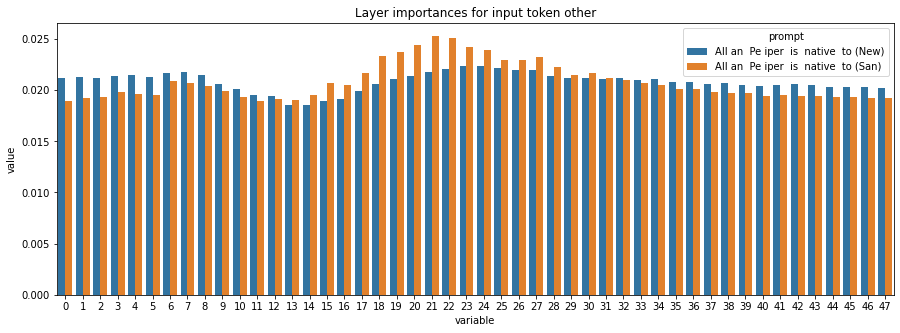

KL divergences between different layer importances for different input tokens for other prompt and this prompt are:
{'subject_0': 0.003375738793693017, 'subject_1': 0.08529820834519342, 'subject_2': 0.019700406468473375, 'subject_3': 0.047354727634228766, 'first': 0.003375738793693017, 'last': 0.0773289647186175, 'other': 0.0023922449618112296}


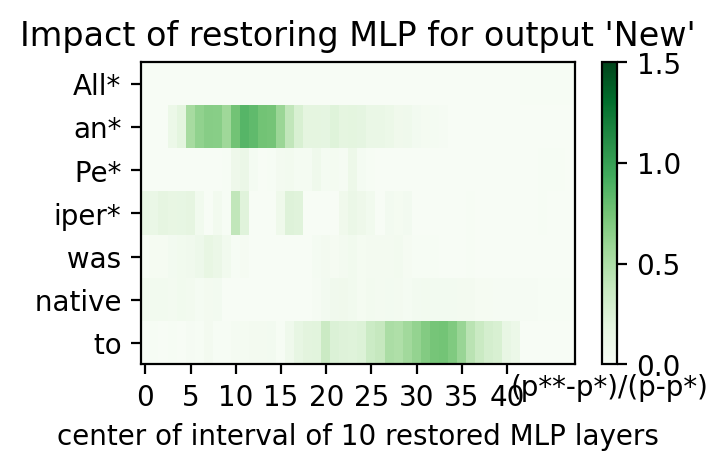

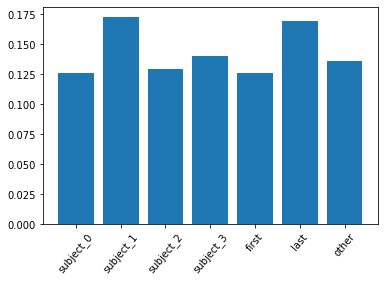

KL divergence between different token importances for LAMA prompt and for this prompt is 0.0009677652269601822


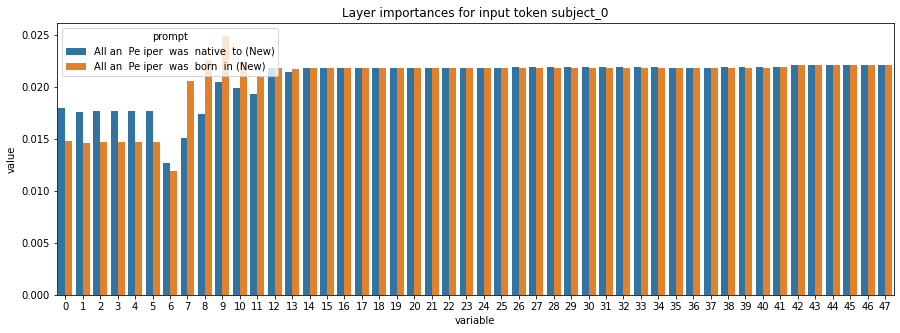

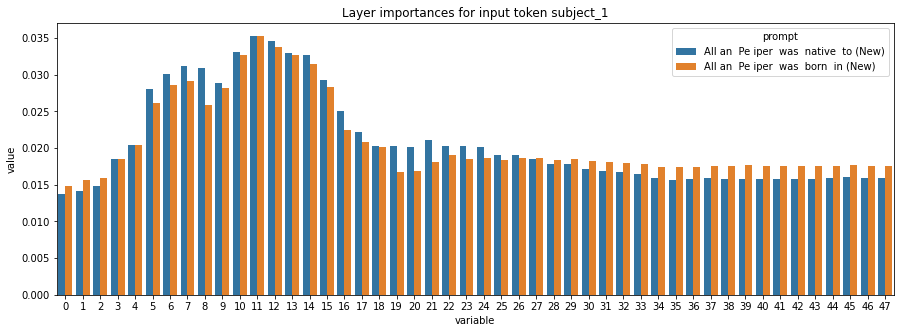

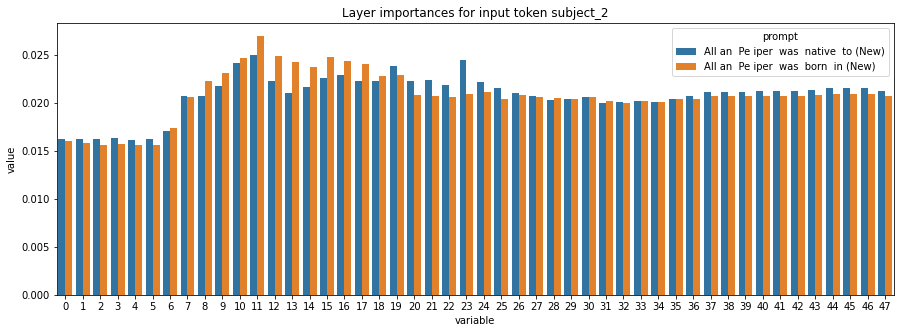

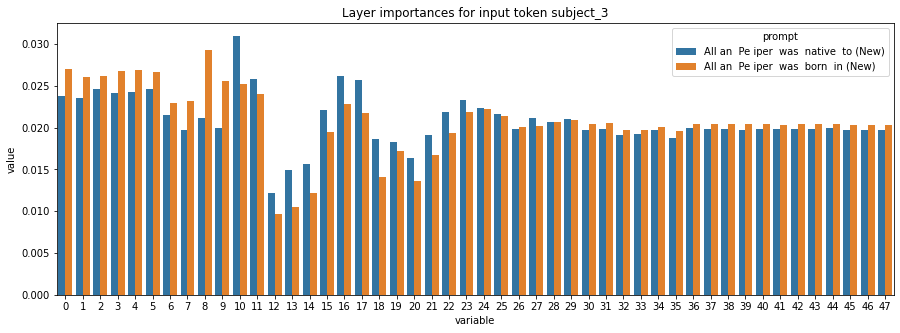

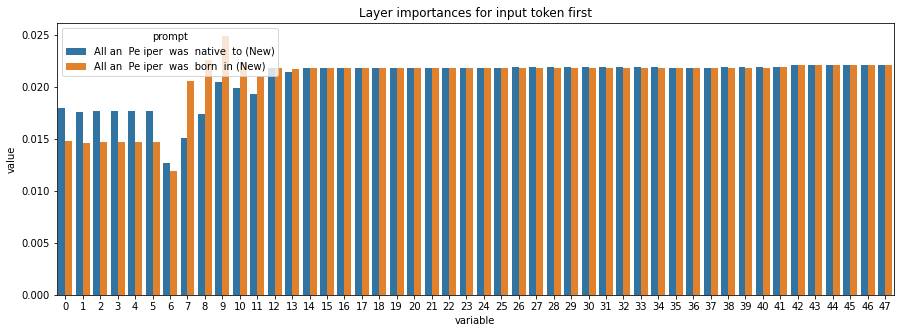

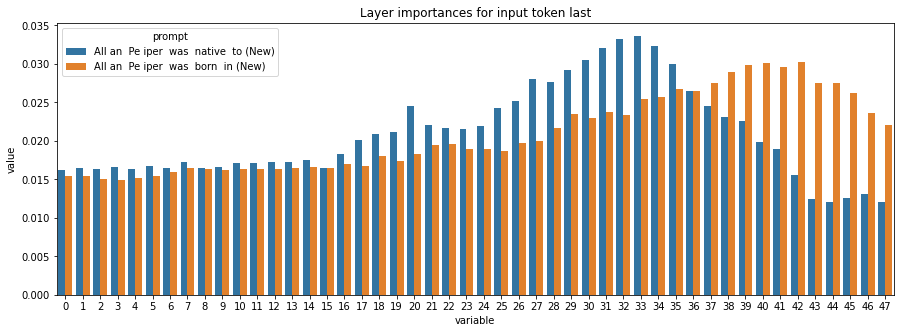

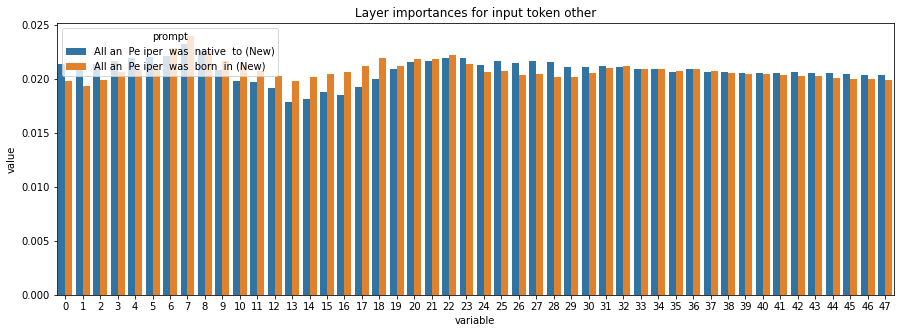

KL divergences between different layer importances for different input tokens for other prompt and this prompt are:
{'subject_0': 0.0039251200988701385, 'subject_1': 0.003490321307481281, 'subject_2': 0.0015079869763212628, 'subject_3': 0.0073846710147336125, 'first': 0.0039251200988701385, 'last': 0.051118236431648256, 'other': 0.0012104944362363312}


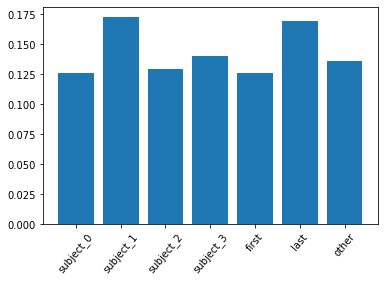

KL divergence between different token importances for LAMA prompt and for this prompt is 0.014053065911866724


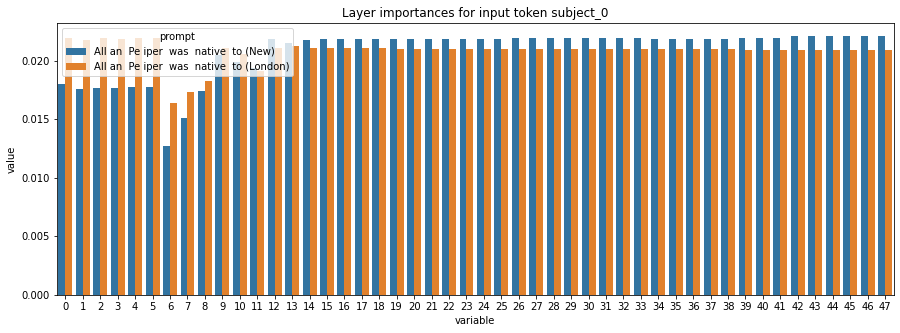

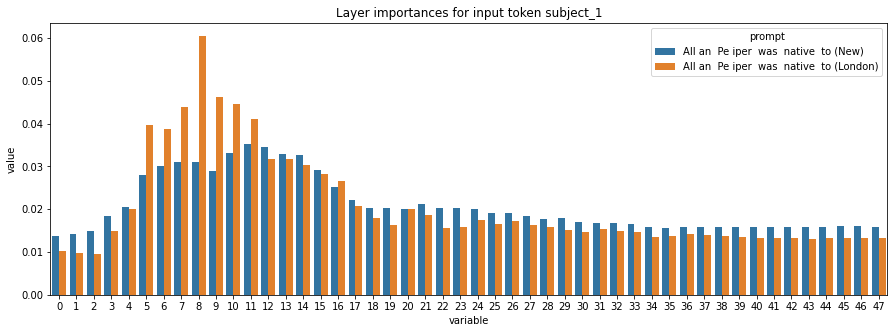

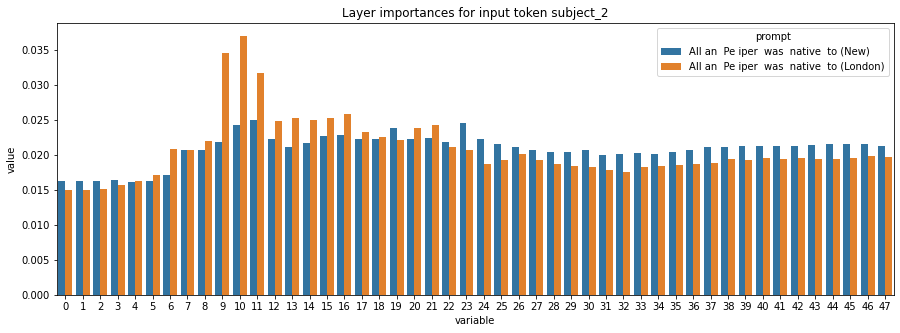

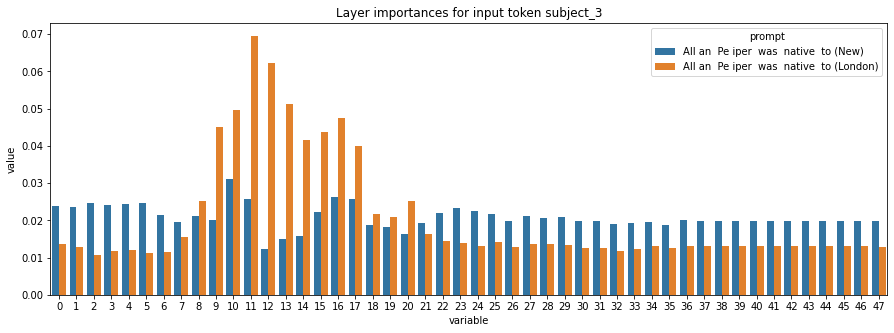

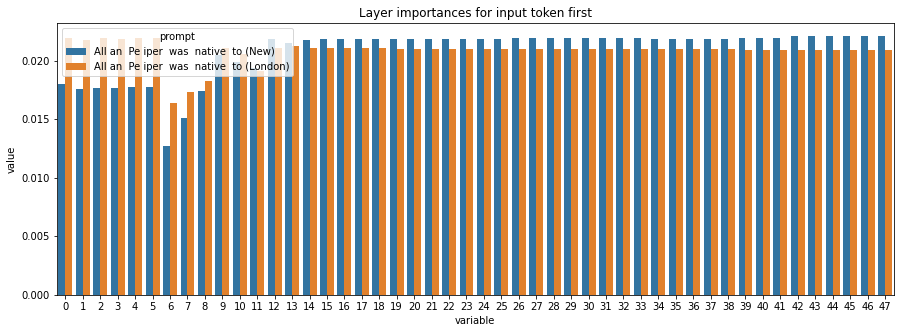

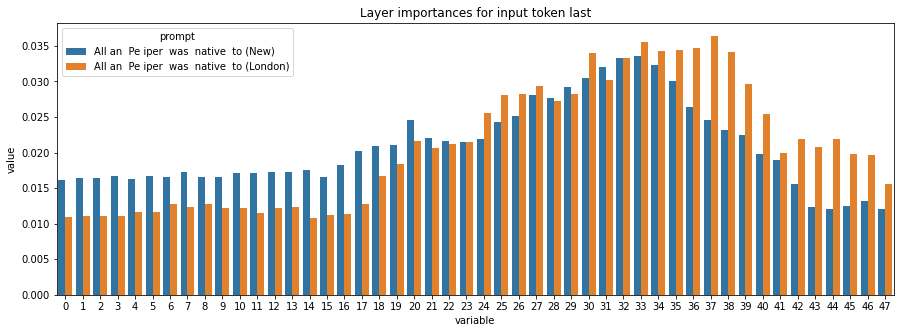

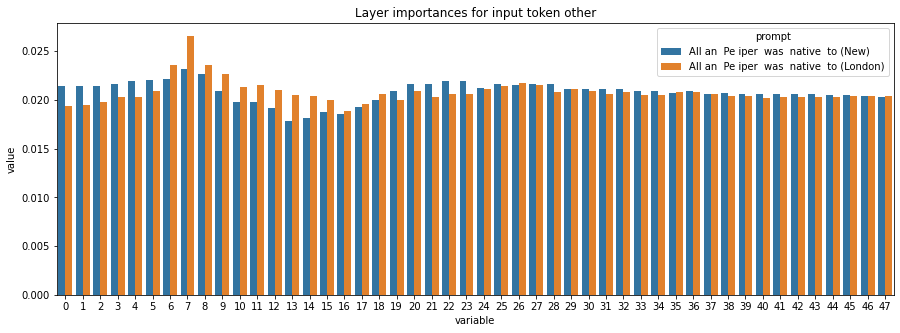

KL divergences between different layer importances for different input tokens for other prompt and this prompt are:
{'subject_0': 0.0041402471251785755, 'subject_1': 0.032299339363817126, 'subject_2': 0.011461002948635723, 'subject_3': 0.2192849691491574, 'first': 0.0041402471251785755, 'last': 0.037340885983610406, 'other': 0.0015476572507395758}


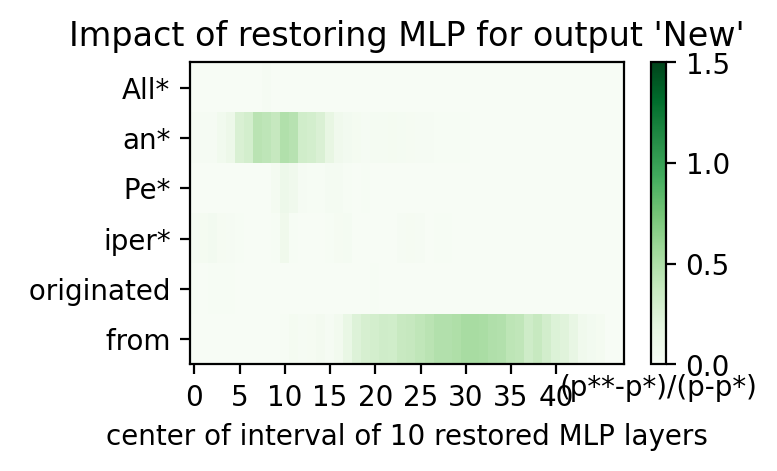

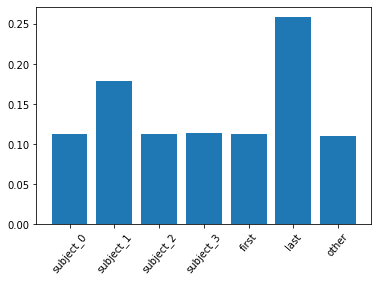

KL divergence between different token importances for LAMA prompt and for this prompt is 0.024995973333716393


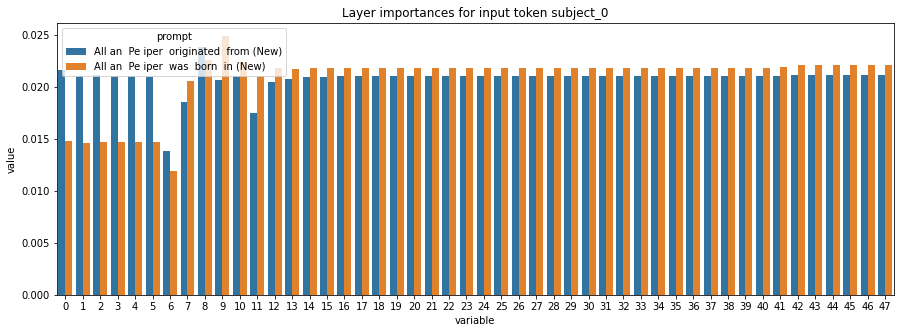

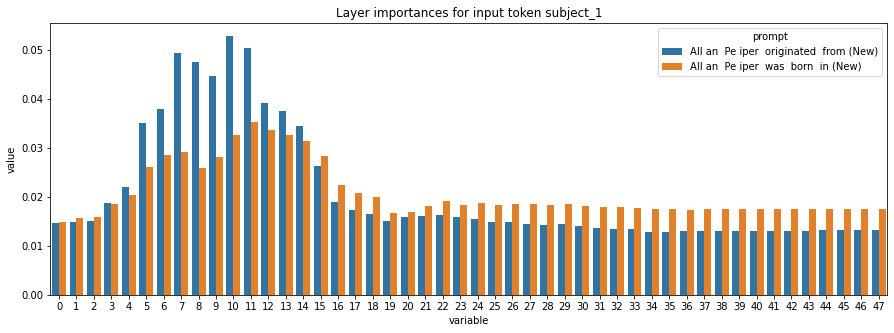

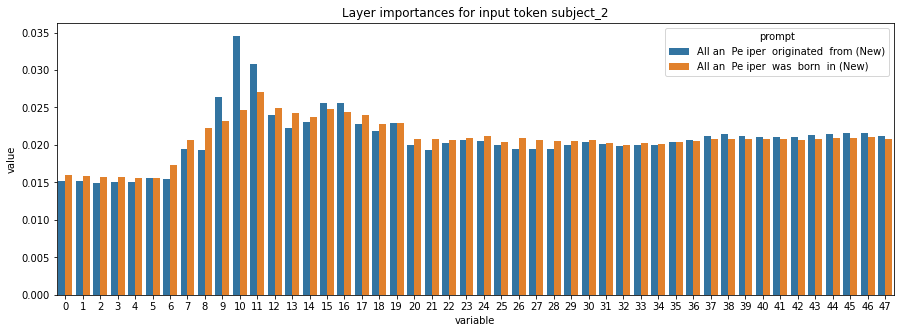

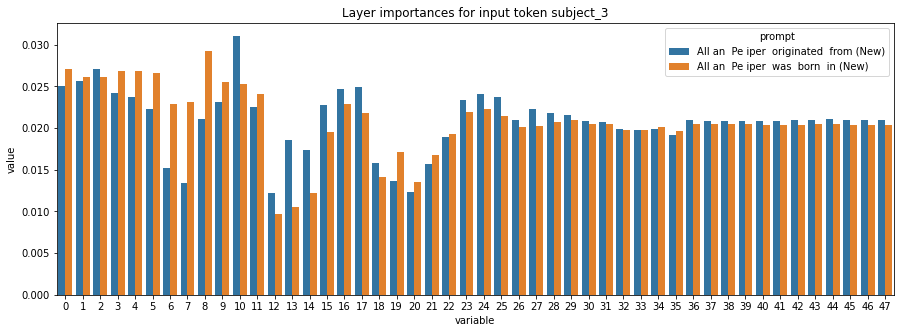

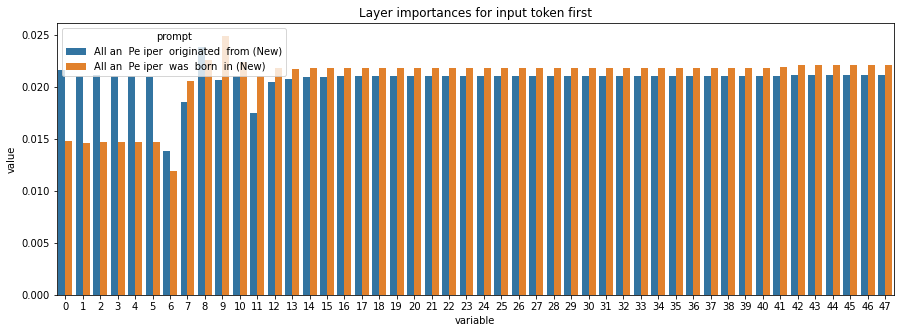

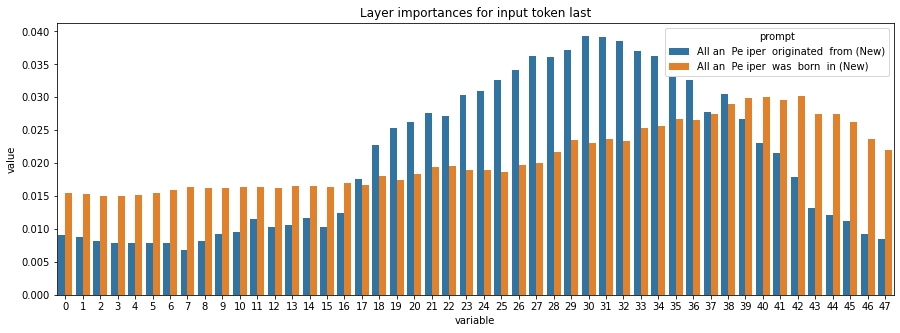

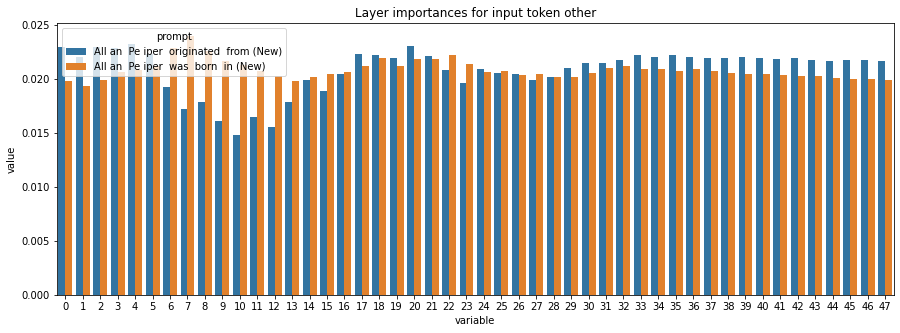

KL divergences between different layer importances for different input tokens for other prompt and this prompt are:
{'subject_0': 0.008204440004192293, 'subject_1': 0.04164980418863706, 'subject_2': 0.002935568363227503, 'subject_3': 0.012381156589981401, 'first': 0.008204440004192293, 'last': 0.12270999353495426, 'other': 0.0074327076035842765}


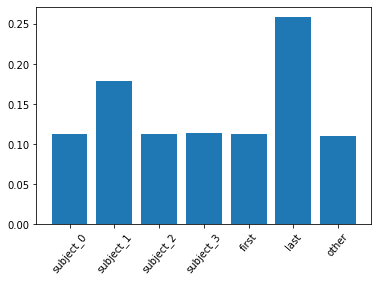

KL divergence between different token importances for LAMA prompt and for this prompt is 0.003879895026329905


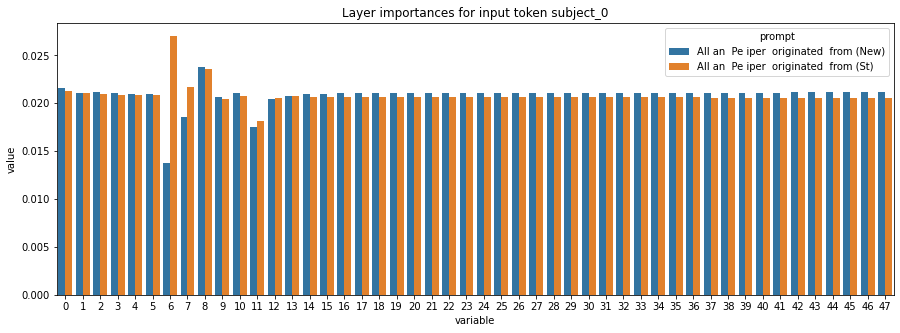

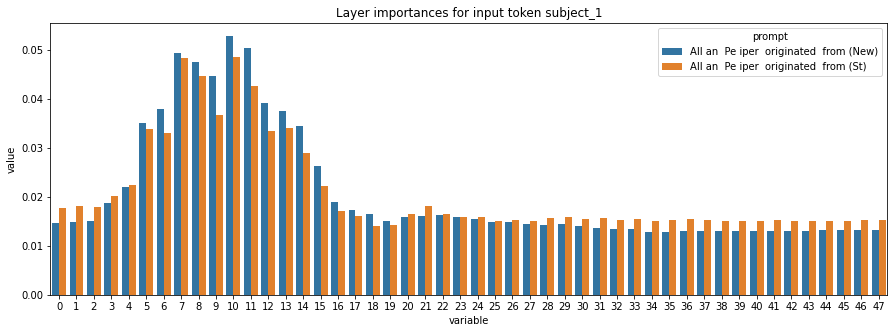

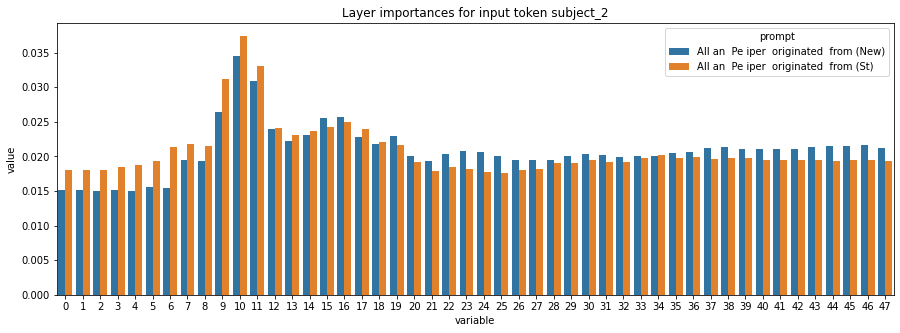

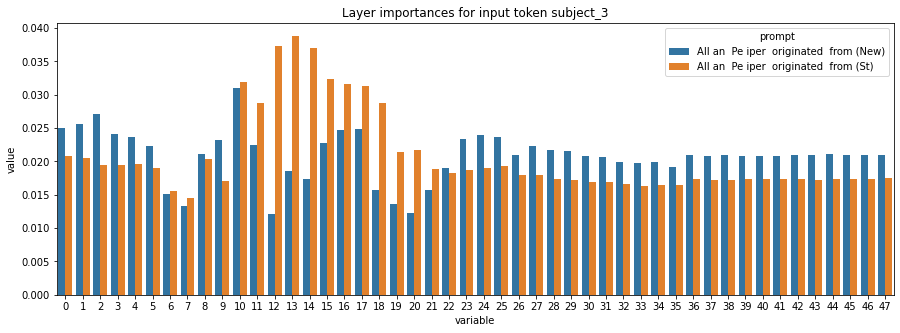

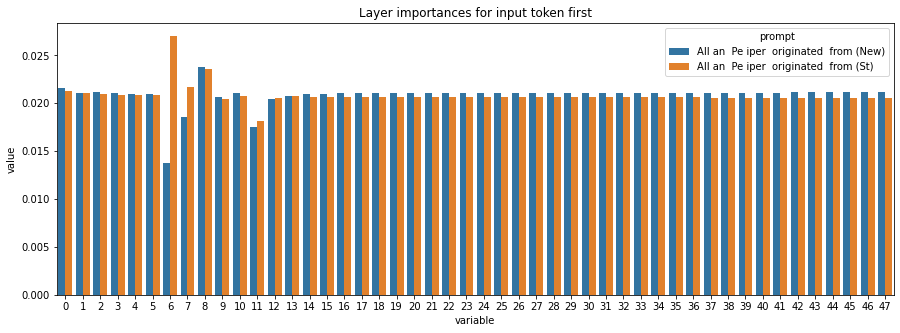

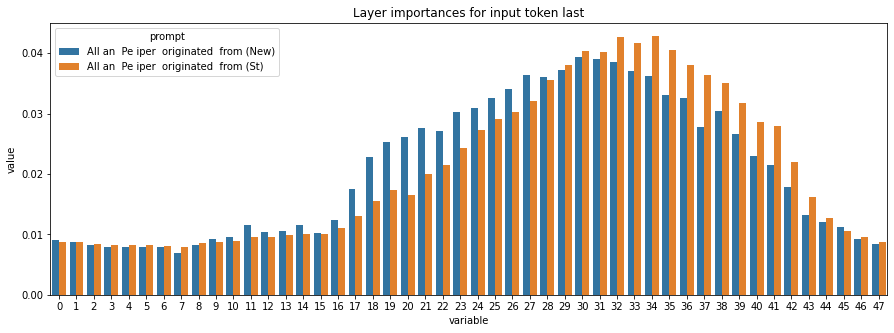

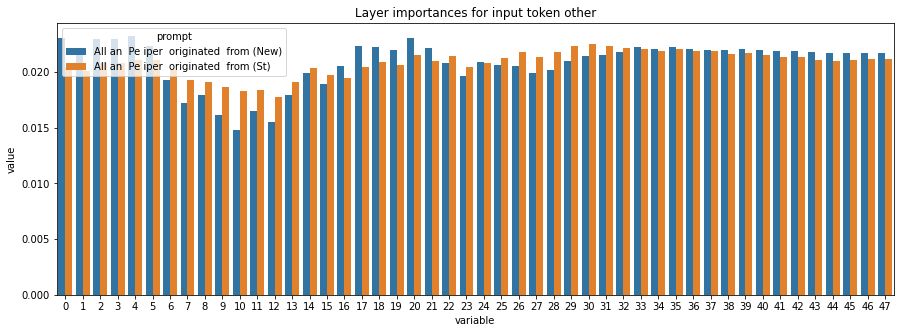

KL divergences between different layer importances for different input tokens for other prompt and this prompt are:
{'subject_0': 0.005401043592428323, 'subject_1': 0.007796148249326507, 'subject_2': 0.005756198363087606, 'subject_3': 0.060290662600891665, 'first': 0.005401043592428323, 'last': 0.01605200919584604, 'other': 0.0022660562717646826}


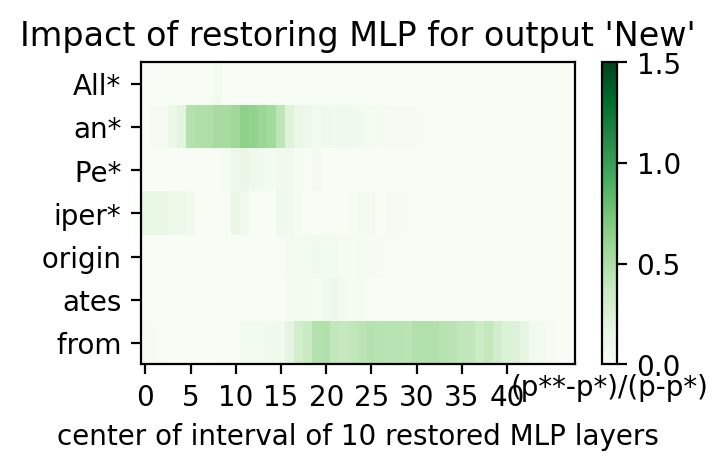

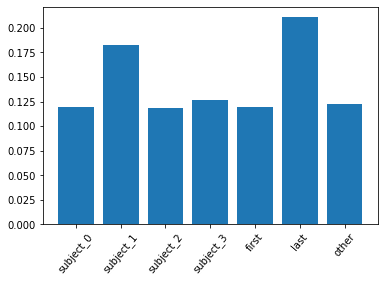

KL divergence between different token importances for LAMA prompt and for this prompt is 0.007361158728599548


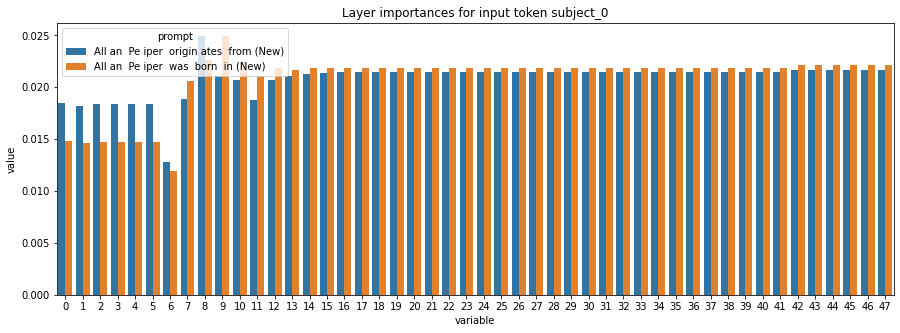

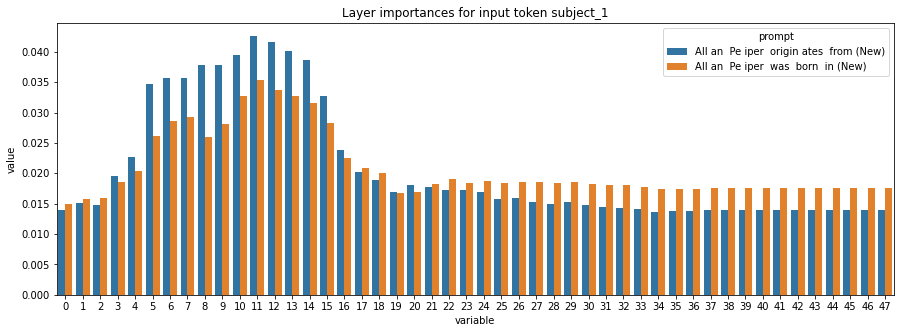

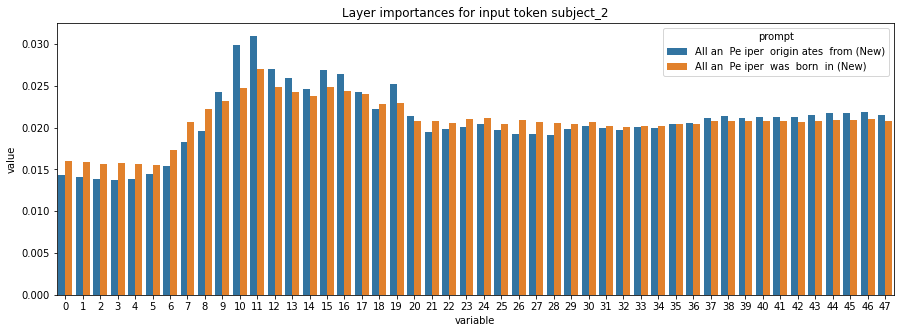

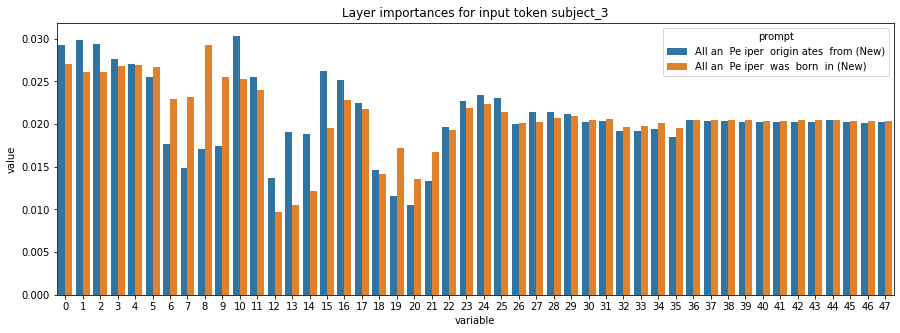

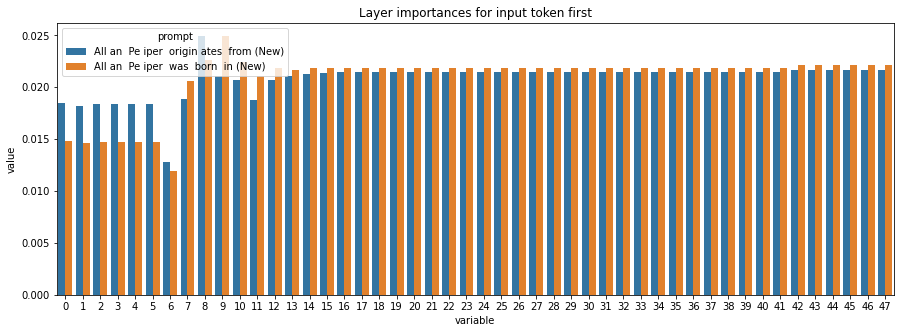

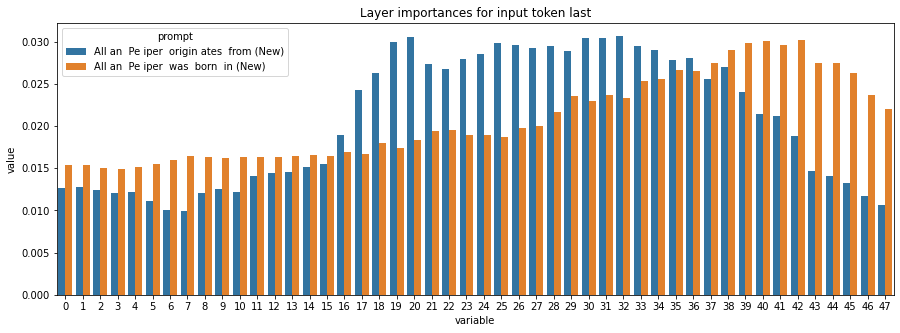

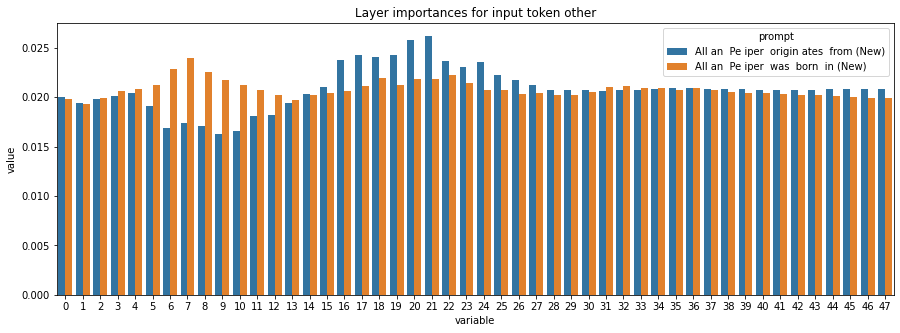

KL divergences between different layer importances for different input tokens for other prompt and this prompt are:
{'subject_0': 0.0032230451761279255, 'subject_1': 0.019702076009707525, 'subject_2': 0.0026489825704629766, 'subject_3': 0.01647622876043897, 'first': 0.0032230451761279255, 'last': 0.0637863784795627, 'other': 0.006655029592366191}


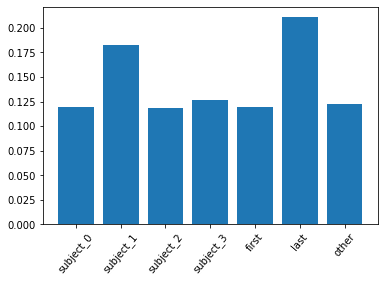

KL divergence between different token importances for LAMA prompt and for this prompt is 0.03747112862765789


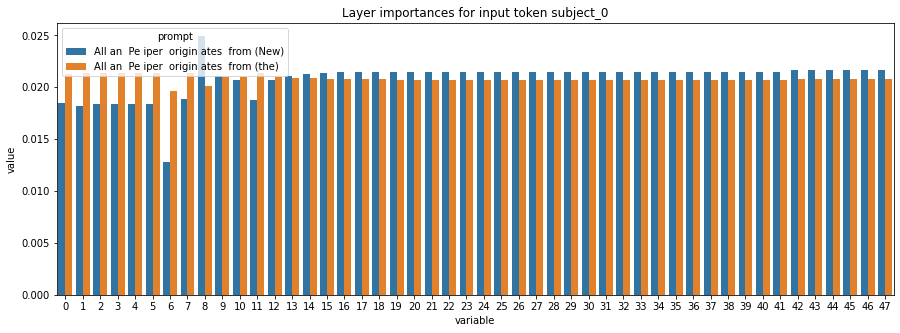

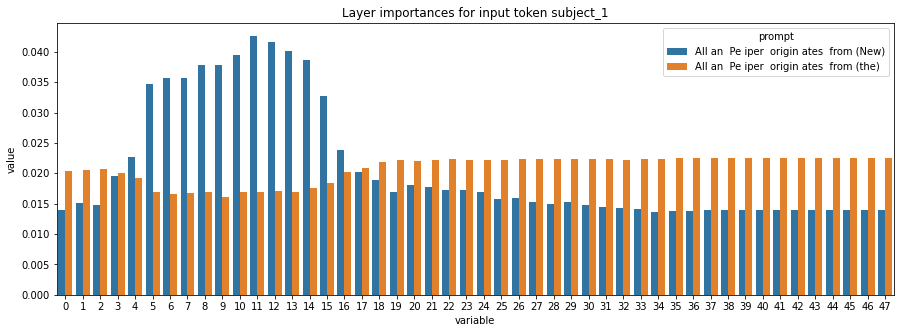

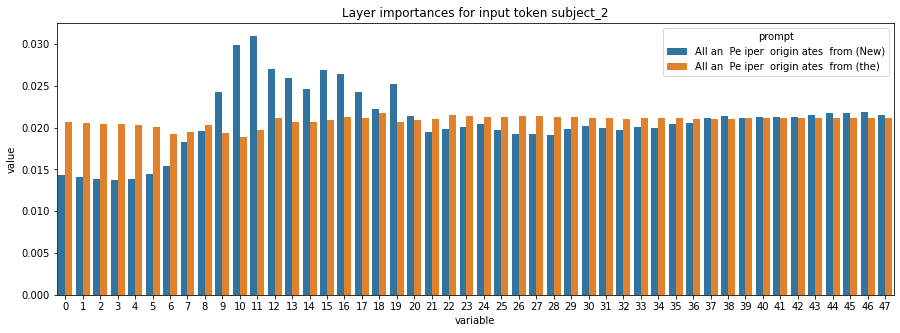

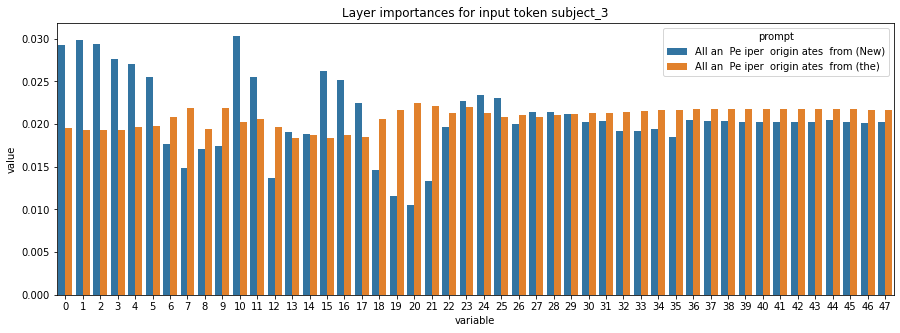

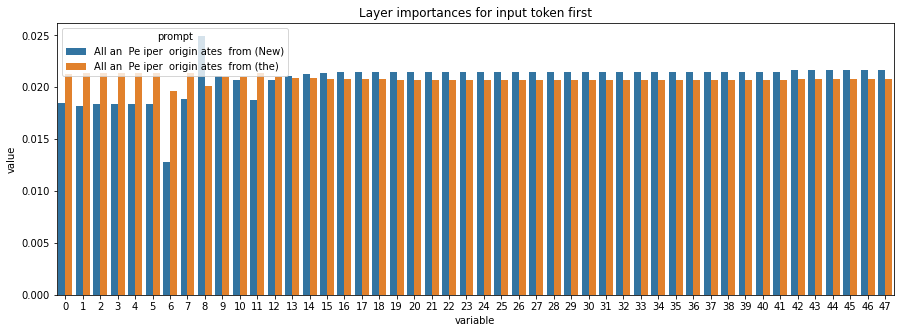

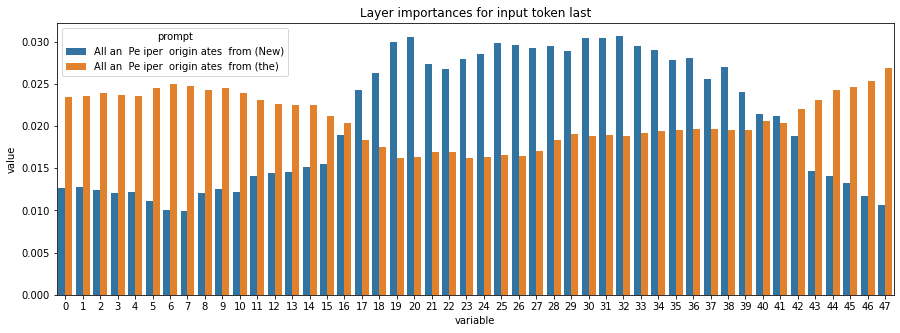

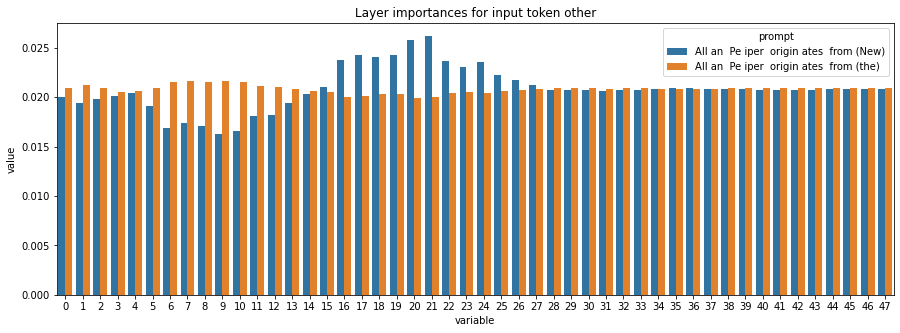

KL divergences between different layer importances for different input tokens for other prompt and this prompt are:
{'subject_0': 0.0042508778715273365, 'subject_1': 0.13355849863728508, 'subject_2': 0.01766296604910167, 'subject_3': 0.031234449852490798, 'first': 0.0042508778715273365, 'last': 0.13914441666565835, 'other': 0.007397107240649348}


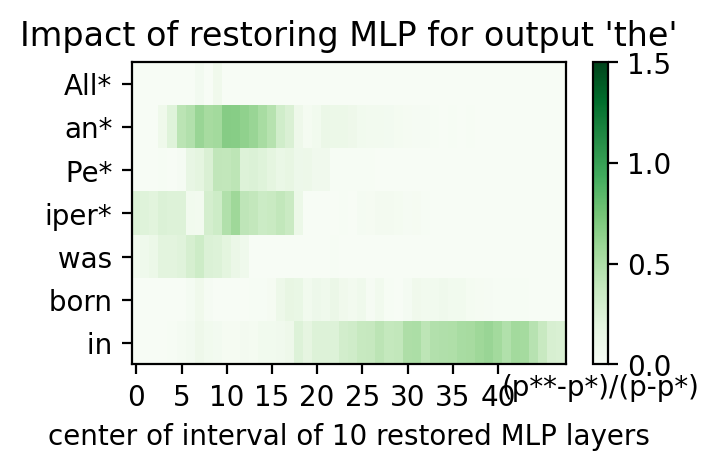

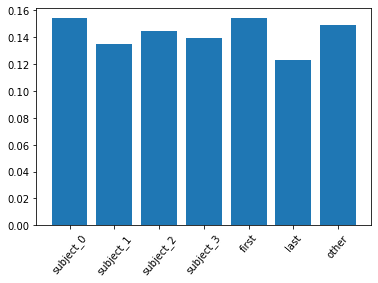

KL divergence between different token importances for LAMA prompt and for this prompt is 0.0


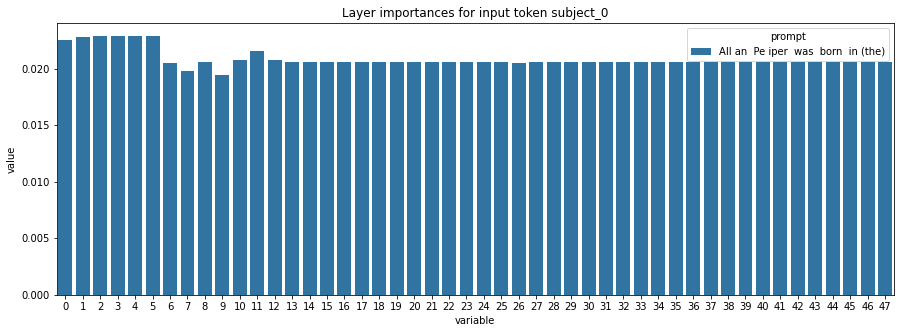

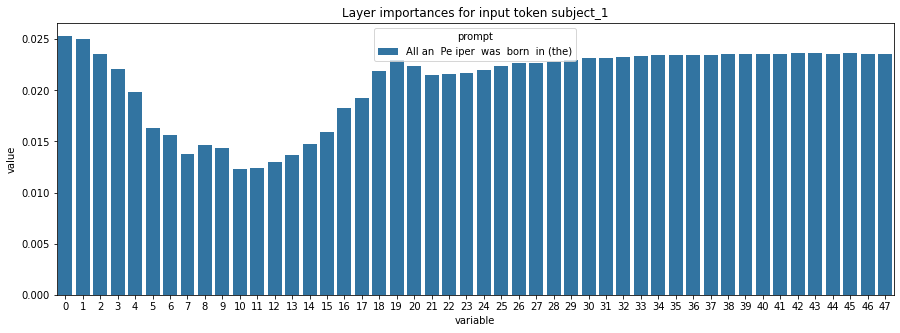

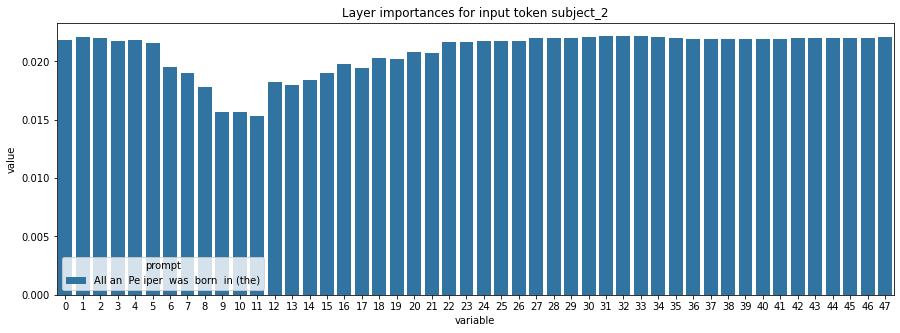

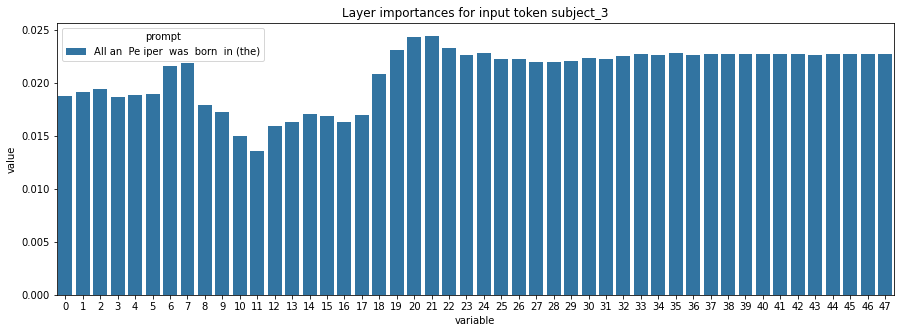

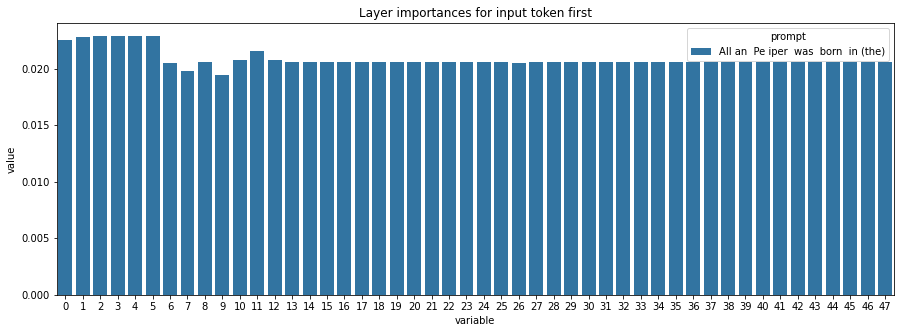

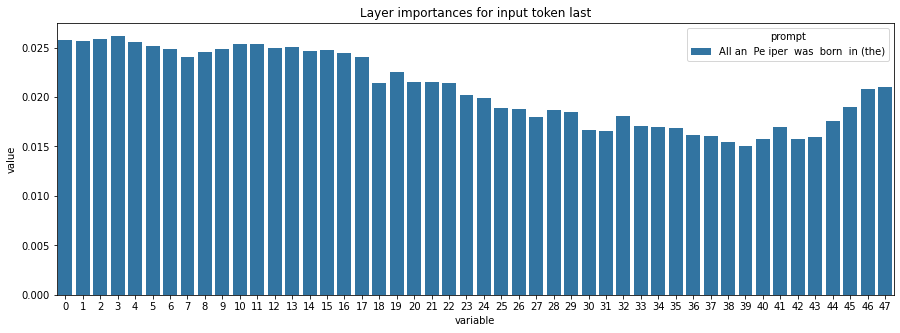

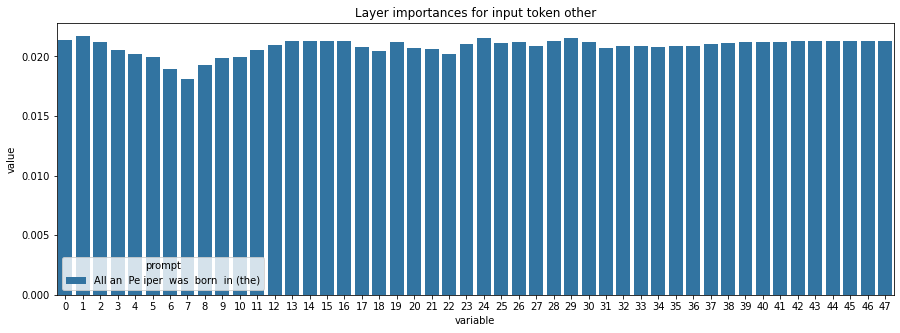

KL divergences between different layer importances for different input tokens for other prompt and this prompt are:
{'subject_0': 0.0, 'subject_1': 0.0, 'subject_2': 0.0, 'subject_3': 0.0, 'first': 0.0, 'last': 0.0, 'other': 0.0}


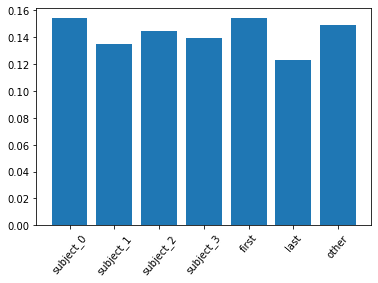

KL divergence between different token importances for LAMA prompt and for this prompt is 0.020325942896306515


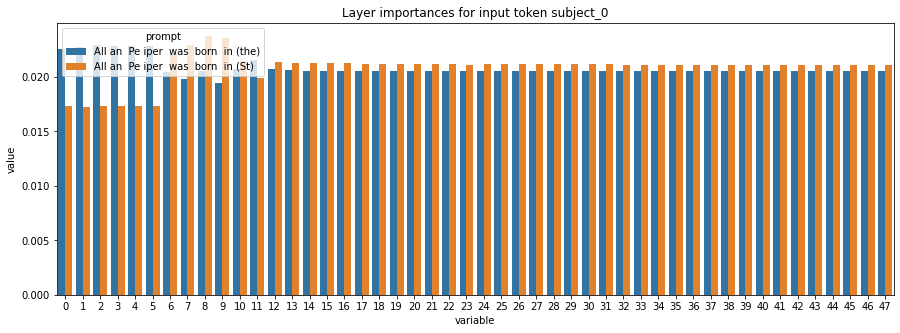

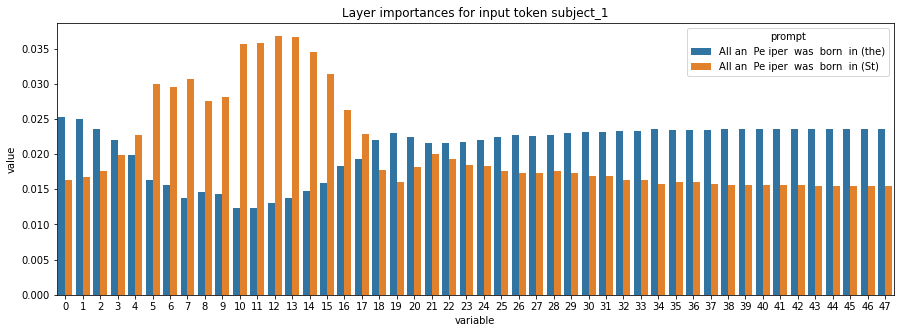

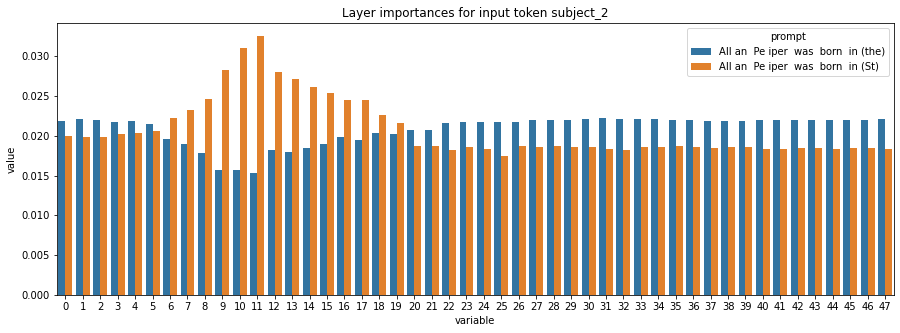

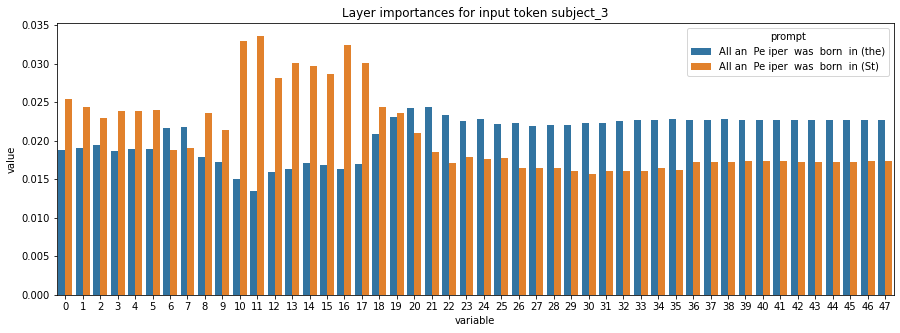

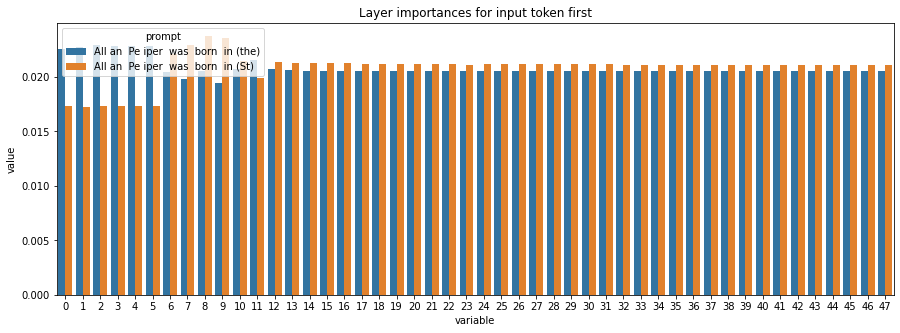

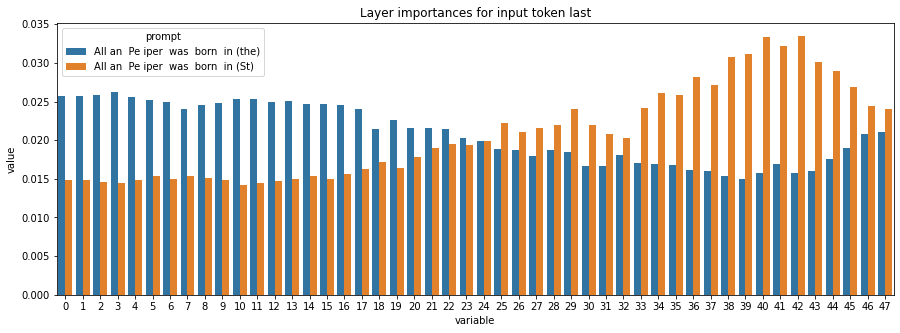

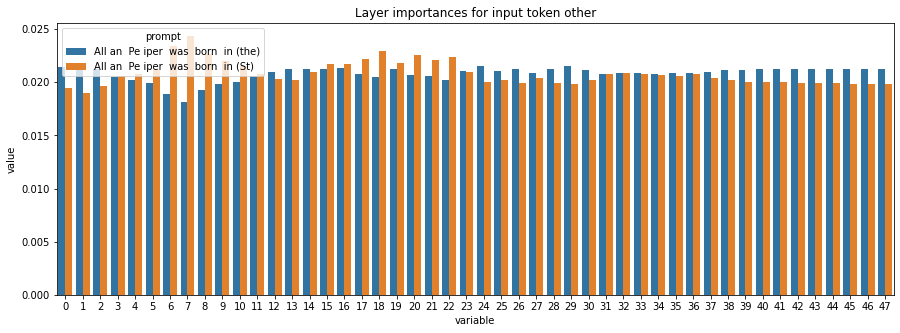

KL divergences between different layer importances for different input tokens for other prompt and this prompt are:
{'subject_0': 0.0056517478078603745, 'subject_1': 0.13699365954380482, 'subject_2': 0.03534733672859147, 'subject_3': 0.07159898075042292, 'first': 0.0056517478078603745, 'last': 0.1033102365618106, 'other': 0.0034096057067927177}


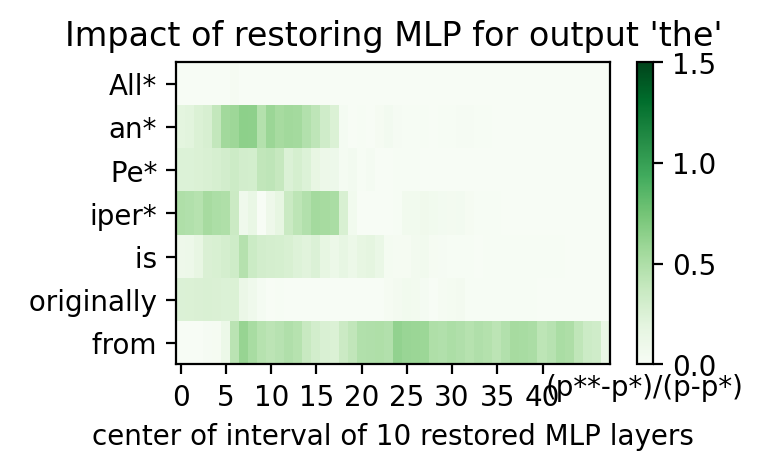

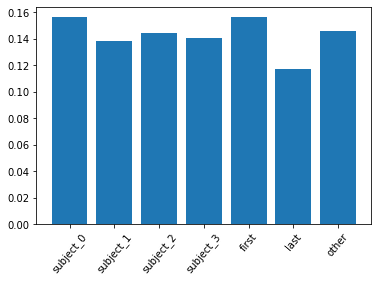

KL divergence between different token importances for LAMA prompt and for this prompt is 0.00024328369181603193


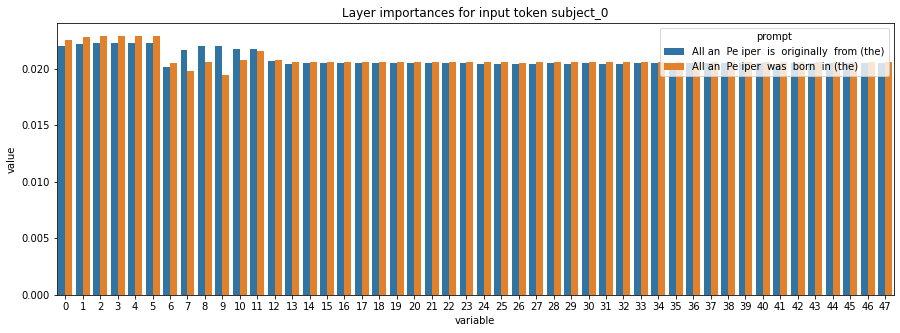

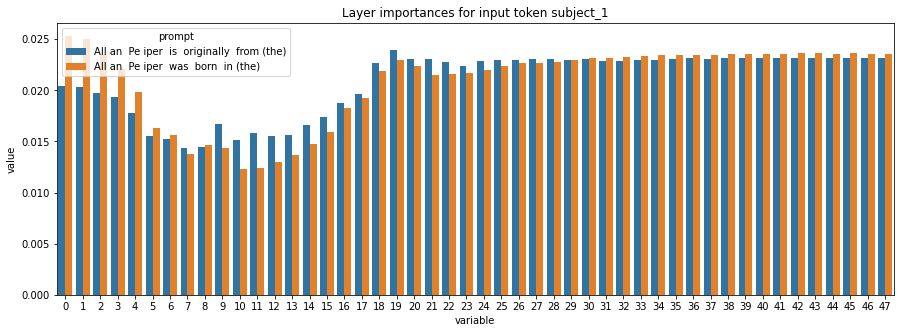

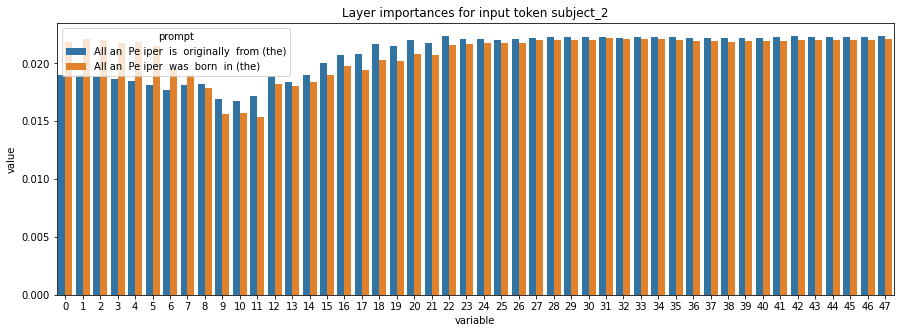

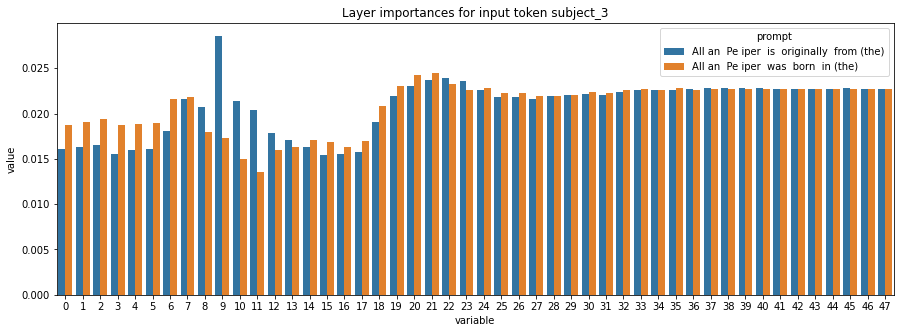

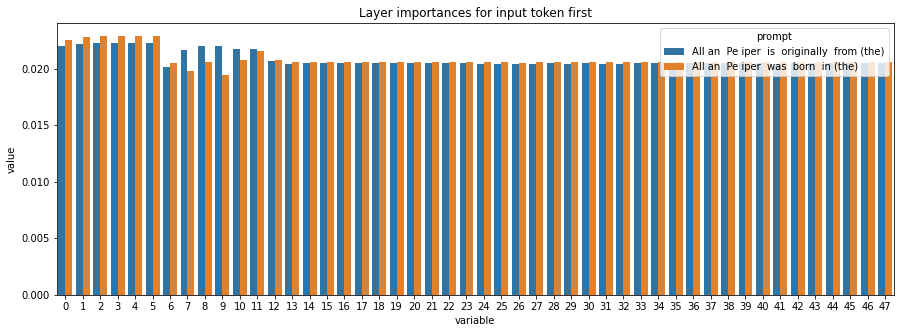

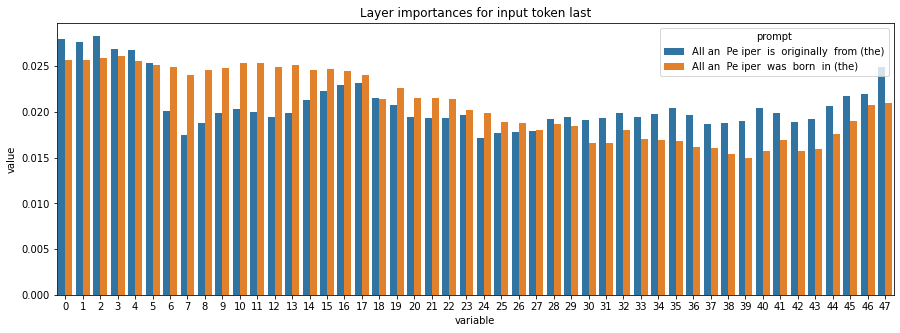

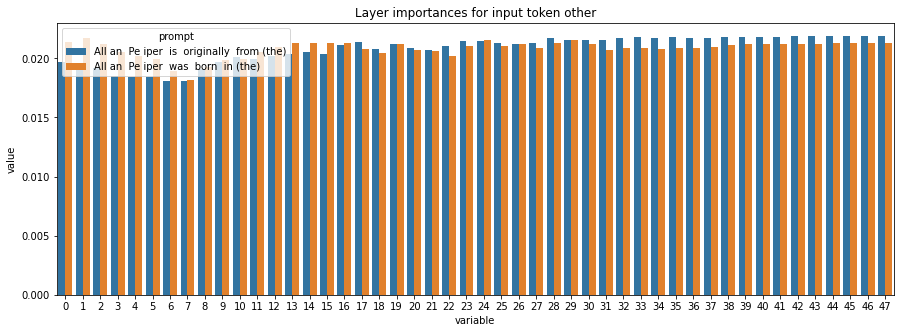

KL divergences between different layer importances for different input tokens for other prompt and this prompt are:
{'subject_0': 0.0003755430007004179, 'subject_1': 0.0033551899614394642, 'subject_2': 0.0021450607164297253, 'subject_3': 0.007462184343239642, 'first': 0.0003755430007004179, 'last': 0.011657168746751267, 'other': 0.0008938743026192242}


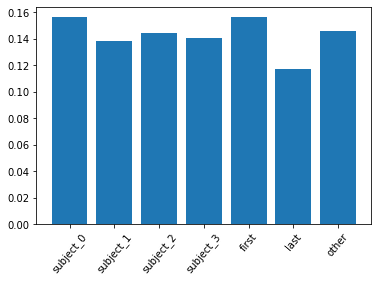

KL divergence between different token importances for LAMA prompt and for this prompt is 0.016638502420391887


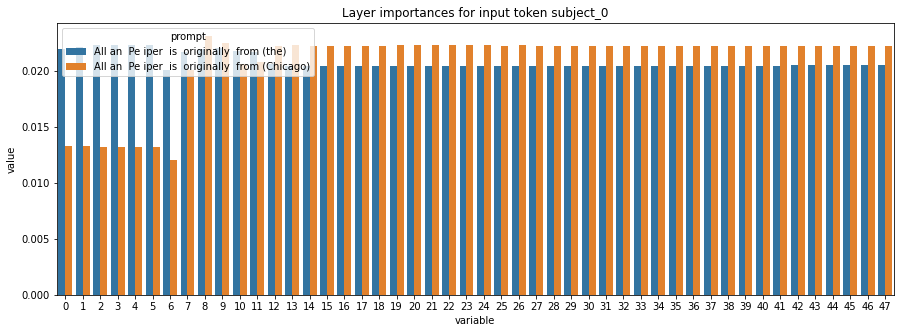

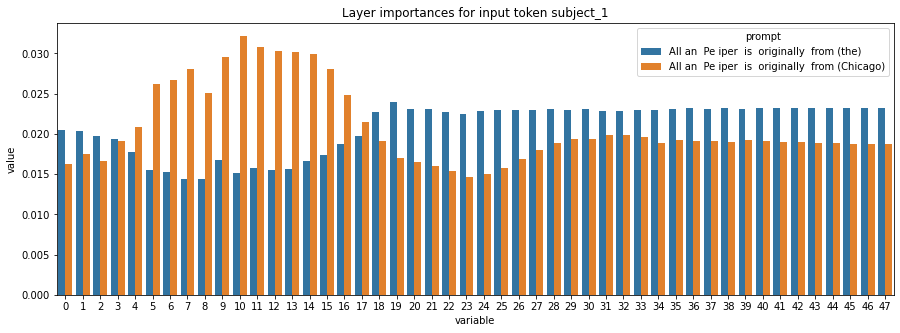

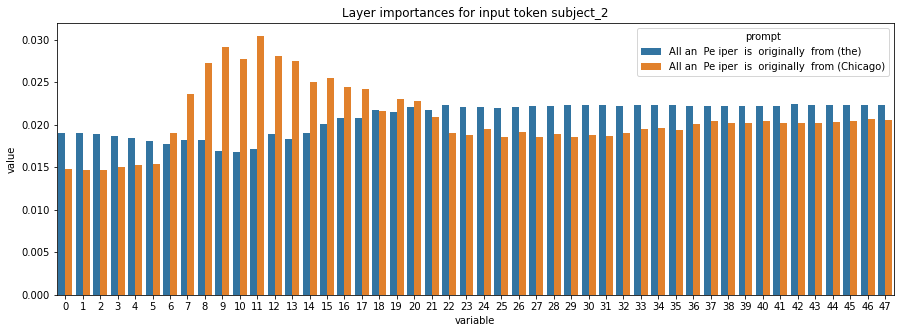

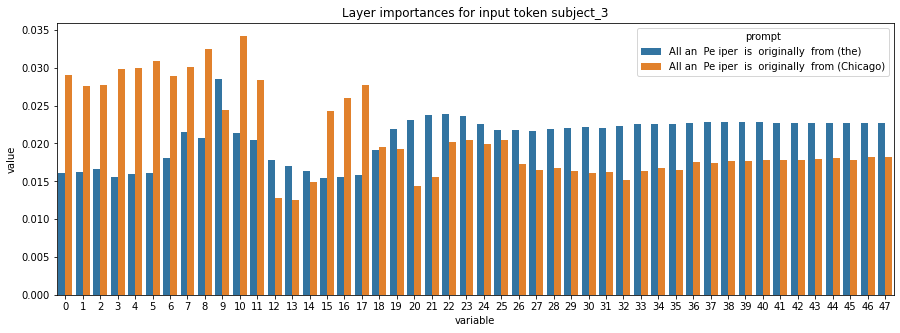

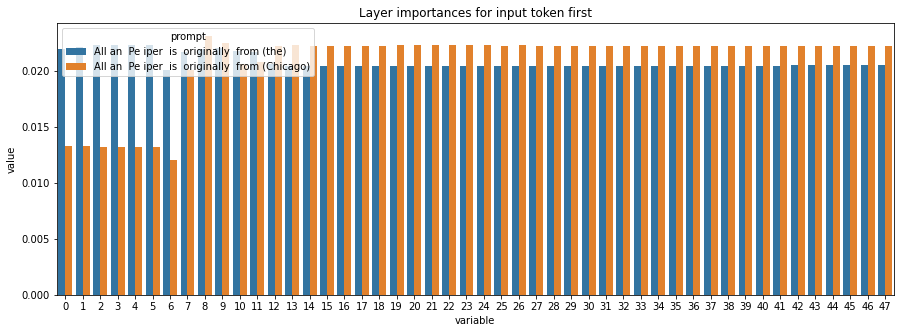

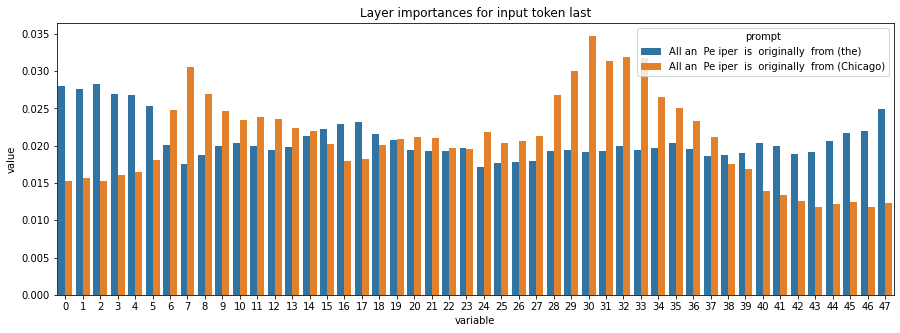

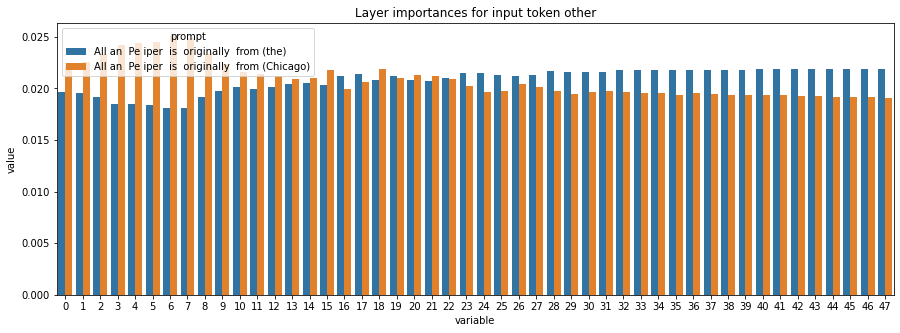

KL divergences between different layer importances for different input tokens for other prompt and this prompt are:
{'subject_0': 0.017629771260544658, 'subject_1': 0.06959052883030381, 'subject_2': 0.026565228254185058, 'subject_3': 0.06810534442774951, 'first': 0.017629771260544658, 'last': 0.06378962661256082, 'other': 0.009518099061097018}


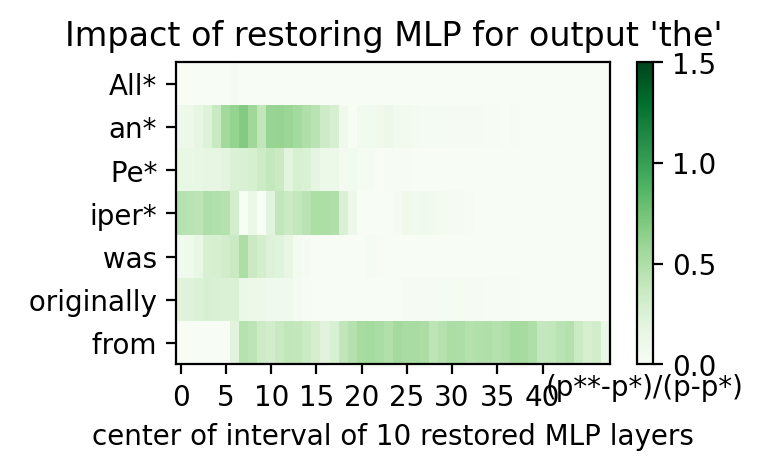

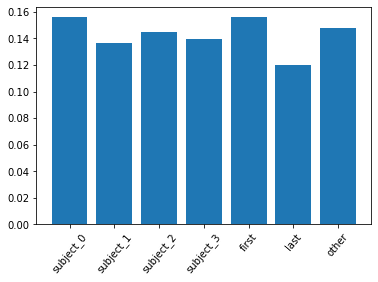

KL divergence between different token importances for LAMA prompt and for this prompt is 8.185816113837063e-05


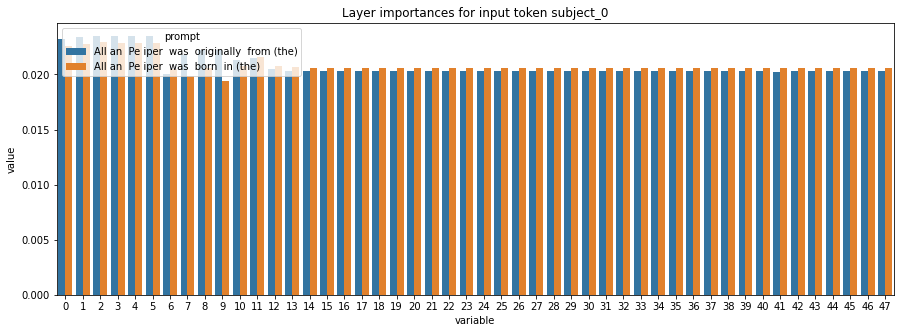

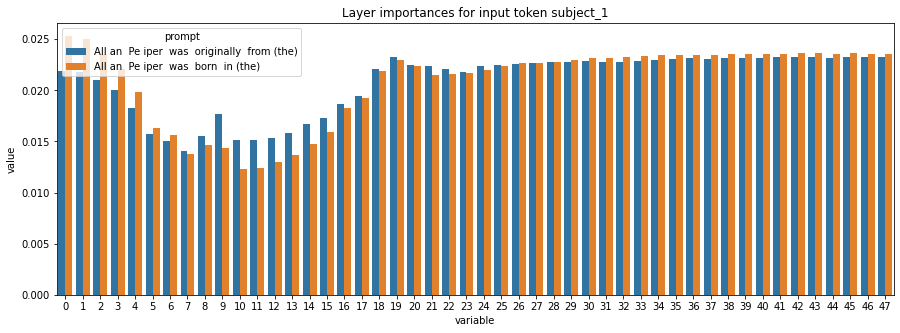

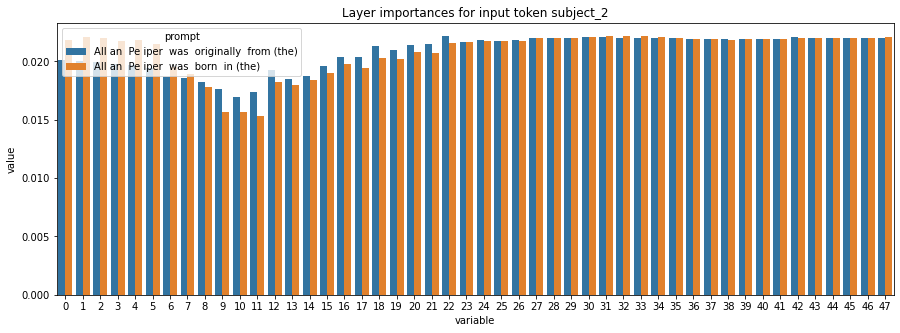

KeyboardInterrupt: 

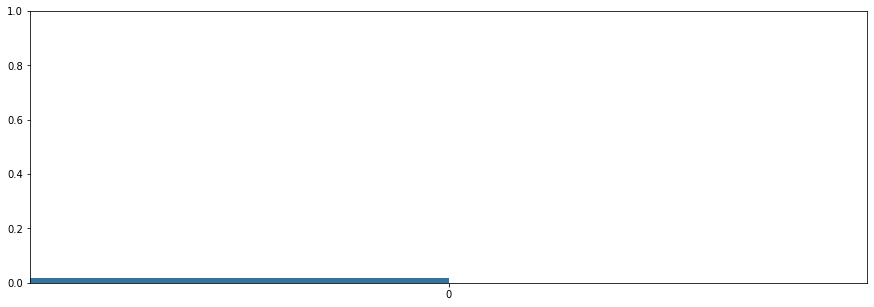

In [45]:
make_plots = True

kl_div_data = []

max_nbr_causal_trace_samples = 1000
for subject in queries.subject.unique()[:3]:
    sample_ixs = list(queries[queries.subject==subject].index)
    #print(f"Plotting results for subject {subject}...")
    for token_ix in range(len(queries.loc[sample_ixs[0]]["top10_tokens"])):
        on_lama_sample = True
        results_lama = np.load(os.path.join(results_folder, f"cases/{sample_ixs[0]}_any_mlp.npz"), allow_pickle=True)
        for sample_ix in sample_ixs:
            results = np.load(os.path.join(results_folder, f"cases/{sample_ix}_any_mlp.npz"), allow_pickle=True)
            answer = queries.loc[sample_ix]["top10_tokens"][token_ix]
            dict_data = {"sample_ix": sample_ix, 
                         "subject": subject, 
                         "top10_token": answer.strip()}

            if make_plots:
                te = (results["scores"][:,:,token_ix]-results["low_score"][token_ix])/(results["high_score"][token_ix]-results["low_score"][token_ix])
                window = results.get("window", 10)
                kind = str(results["kind"])
                labels = list(results["input_tokens"])
                for i in range(*results["subject_range"]):
                    labels[i] = labels[i] + "*"
                bartitle = f"(p**-p*)/(p-p*)"
                plot_normalized_trace_heatmap_from_values(te, 0, 1.5, bartitle, kind, window, labels,
                                               savepdf=False, title=f"Impact of restoring MLP for output '{answer.strip()}'", xlabel=None, modelname=None)
            
            dict_data.update(get_kl_dict_entry(results, results_lama, token_ix, token_ix, answer.strip(), answer.strip(), make_plots))
            
            # get baseline results for another random query (not LAMA prompt correspondence)
            #subject_random = random.sample(list(queries.iloc[:max_nbr_causal_trace_samples].subject.unique()), 1)[0]
            #sample_ix_random = random.sample(list(queries[queries.subject==subject_random].index), 1)[0]
            #top10_token_random = random.sample(queries.loc[sample_ix_random]["top10_tokens"], 1)[0]
            subject_random = subject
            sample_ix_random = sample_ix
            top10_tokens_for_sampling = queries.loc[sample_ix_random]["top10_tokens"].copy()
            top10_tokens_for_sampling.remove(answer)
            top10_token_random = random.sample(top10_tokens_for_sampling, 1)[0]
            top10_token_ix_random = queries.loc[sample_ix_random]["top10_tokens"].index(top10_token_random)
            dict_data_random = {"sample_ix_random": sample_ix_random,
                                "subject_random": subject_random,
                                "top10_token_random": top10_token_random.strip()
                               }
            results_random = np.load(os.path.join(results_folder, f"cases/{sample_ix_random}_any_mlp.npz"), allow_pickle=True)
            dict_data_random.update({f"{key}_random": val for key, val in get_kl_dict_entry(results, results_random, token_ix, top10_token_ix_random, answer.strip(), top10_token_random.strip(), make_plots).items()})
            
            dict_data.update(dict_data_random)
            kl_div_data.append(dict_data)
            
kl_div_data = pd.DataFrame(kl_div_data)
kl_div_data.head()

In [37]:
kl_div_data.iloc[1]

sample_ix                                               1
subject                                      Allan Peiper
top10_token                                           New
token_importance_div                             0.000114
layer_importance_div_subject_first               0.000799
layer_importance_div_subject_1                   0.001877
layer_importance_div_subject_2                   0.000271
layer_importance_div_subject_last                0.002482
layer_importance_div_first                       0.000799
layer_importance_div_last                        0.023848
layer_importance_div_other                       0.001019
all_token_layers_importance_div                  0.005367
sample_ix_random                                        1
subject_random                               Allan Peiper
top10_token_random                                     18
token_importance_div_random                      0.025186
layer_importance_div_subject_first_random        0.029235
layer_importan

In [32]:
kl_div_data.mean()

sample_ix                                    349.500000
token_importance_div                           0.008966
layer_importance_div_subject_first             0.012553
layer_importance_div_subject_1                 0.016984
layer_importance_div_subject_2                 0.012868
layer_importance_div_subject_last              0.022603
layer_importance_div_first                     0.012553
layer_importance_div_last                      0.030027
layer_importance_div_other                     0.002679
all_token_layers_importance_div                0.025582
sample_ix_random                             349.500000
token_importance_div_random                    0.029353
layer_importance_div_subject_first_random      0.038069
layer_importance_div_subject_1_random          0.070591
layer_importance_div_subject_2_random          0.045918
layer_importance_div_subject_last_random       0.074545
layer_importance_div_first_random              0.038069
layer_importance_div_last_random               0

Divergence values measured are very small.
- Check max
- Add random comparison to other queries (of same subject length!)
- Is the code correct? Double check.

### Measure impact pattern similarities between paraphrases for the same output tokens

In [ ]:
results = np.load(os.path.join(results_folder, f"cases/0_any_mlp.npz"), allow_pickle=True)
low_score = results["low_score"][token_ix]
te_1 = (results["scores"][:,:,token_ix]-results["low_score"][token_ix])/(results["high_score"][token_ix]-results["low_score"][token_ix])

results = np.load(os.path.join(results_folder, f"cases/1_any_mlp.npz"), allow_pickle=True)
low_score = results["low_score"][token_ix]
te_2 = (results["scores"][:,:,token_ix]-results["low_score"][token_ix])/(results["high_score"][token_ix]-results["low_score"][token_ix])
